# Pilot 2025 CO2-solubility/O2 integrated calibration, estimability and DOE

This notebook documents the deterministic workflow used for the pilot-scale natural-must dataset. It starts from the reduced extended fermentation model already used in the previous notebooks, then replaces the purely empirical CO2 gas-flow lag with a dissolved-CO2 buffer model and a parsimonious macroscopic oxygen transition model.

Selected inherited secondary structure: `secondary_full_chem_o2fixed`.

Selected inherited aroma structure: `ea_ethanol_nlimited`.

Selected CO2 structure after the new benchmark: `solubility_o2_slow_transition`.


In [1]:
from pathlib import Path
import json
import pandas as pd
from IPython.display import Image, display
RESULTS = Path('results/co2_solubility_integrated_doe')
PLOTS = RESULTS / 'plots'
print(RESULTS.resolve())


C:\Users\ctorrealba\OneDrive - Viña Concha y Toro S.A\Documentos\Doctorado\Artículos\Artículo - Estimación_dFBA\pyomo-doe\fermentation_model\pilot_2025\results\co2_solubility_integrated_doe


## 1. Full model used as baseline

The core fermentation model tracks viable biomass \(X\), dead biomass \(X_d\), assimilable nitrogen \(N\), glucose \(G\), fructose \(F\), ethanol \(E\), and glycerol \(Gly\):

$$\frac{dX}{dt}=(\mu-k_d)X+u_X$$

$$\frac{dX_d}{dt}=k_dX$$

$$\frac{dN}{dt}=-q_N f_N(T,N)X+u_N$$

$$\frac{dG}{dt}=-\left(q_{XG}f_N+q_{EG}f_G+m\frac{G}{G+F}\right)X+u_G$$

$$\frac{dF}{dt}=-\left(q_{XF}f_N+q_{EF}f_F+m\frac{F}{G+F}\right)X+u_F$$

$$\frac{dE}{dt}=(\beta_G f_G+\beta_F f_F)X+u_E$$

$$\frac{dGly}{dt}=(\gamma_G f_G+\gamma_F f_F)X$$

The secondary layer keeps pyruvate, acetaldehyde, acetate, and oxygen as the reduced chemical-proxy states. In this pilot notebook, the CO2 block additionally uses a macro-O2 state to delay the effective anaerobic ethanol/CO2 source when the must is initially air-saturated. The aroma layer predicts retained liquid concentration and accumulated condenser-equivalent loss for ethyl acetate, isoamyl acetate, and ethyl octanoate.


### Data read and curation check

In [2]:
pd.read_csv(RESULTS / 'co2_curation_decisions.csv')

,batch,raw_rows,used_for_calibration,reason,activation_time_h,curated_rows
0,25150,56,False,excluded: CO2 file not usable for this batch,NaN,0
1,25151,56,False,excluded: CO2 file not usable for this batch,NaN,0
2,25170,22833,True,kept,0.0,22794
3,25171,20000,True,trimmed to annotated process restart sample,114.0,13123


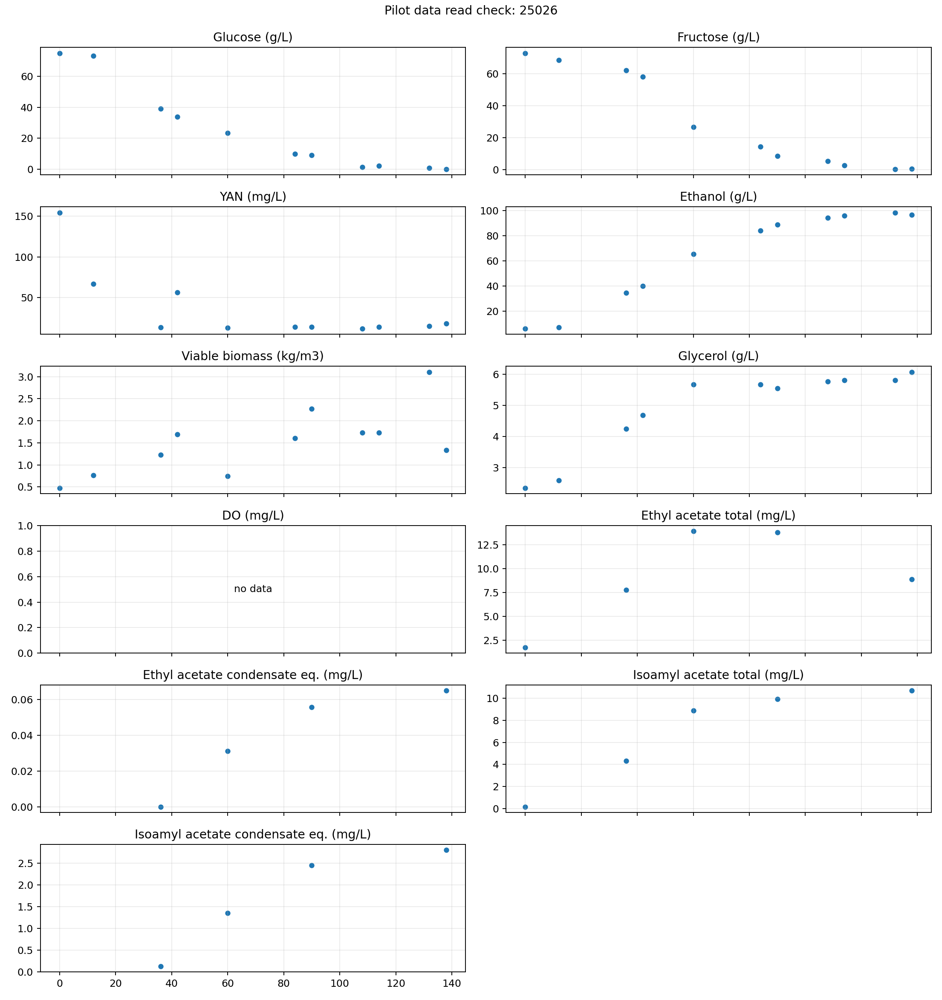

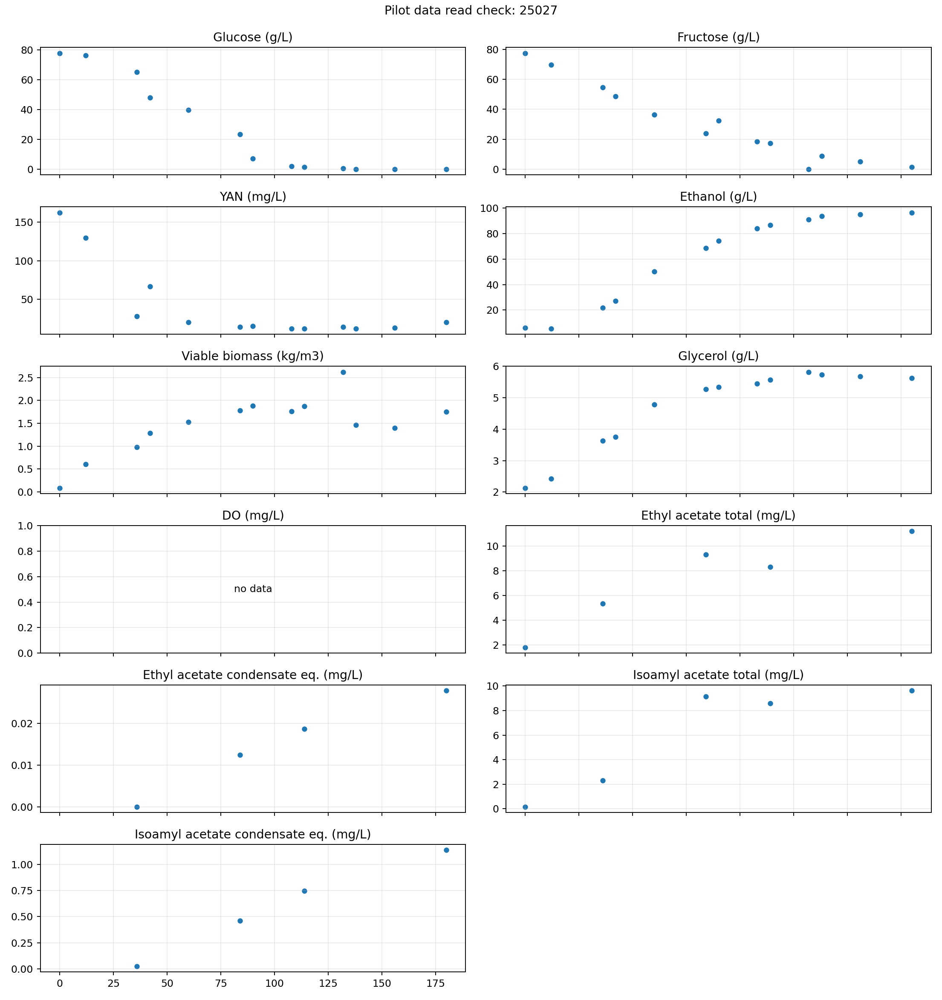

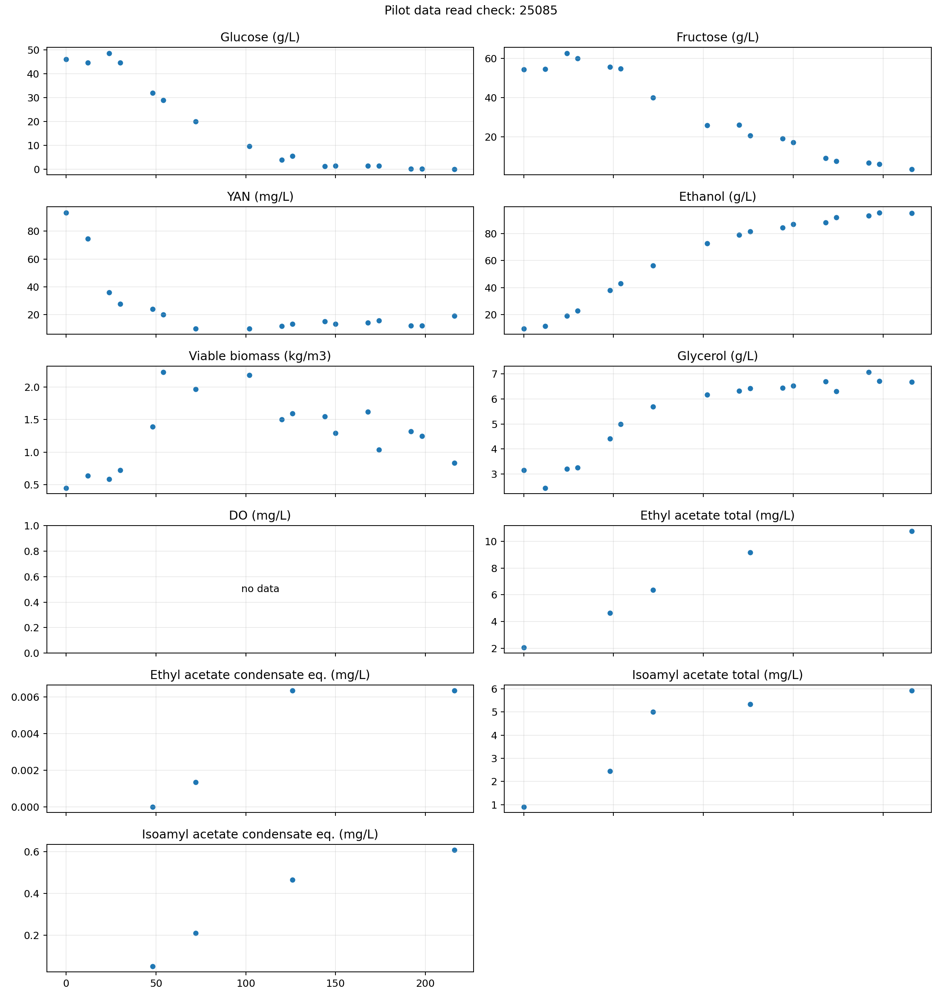

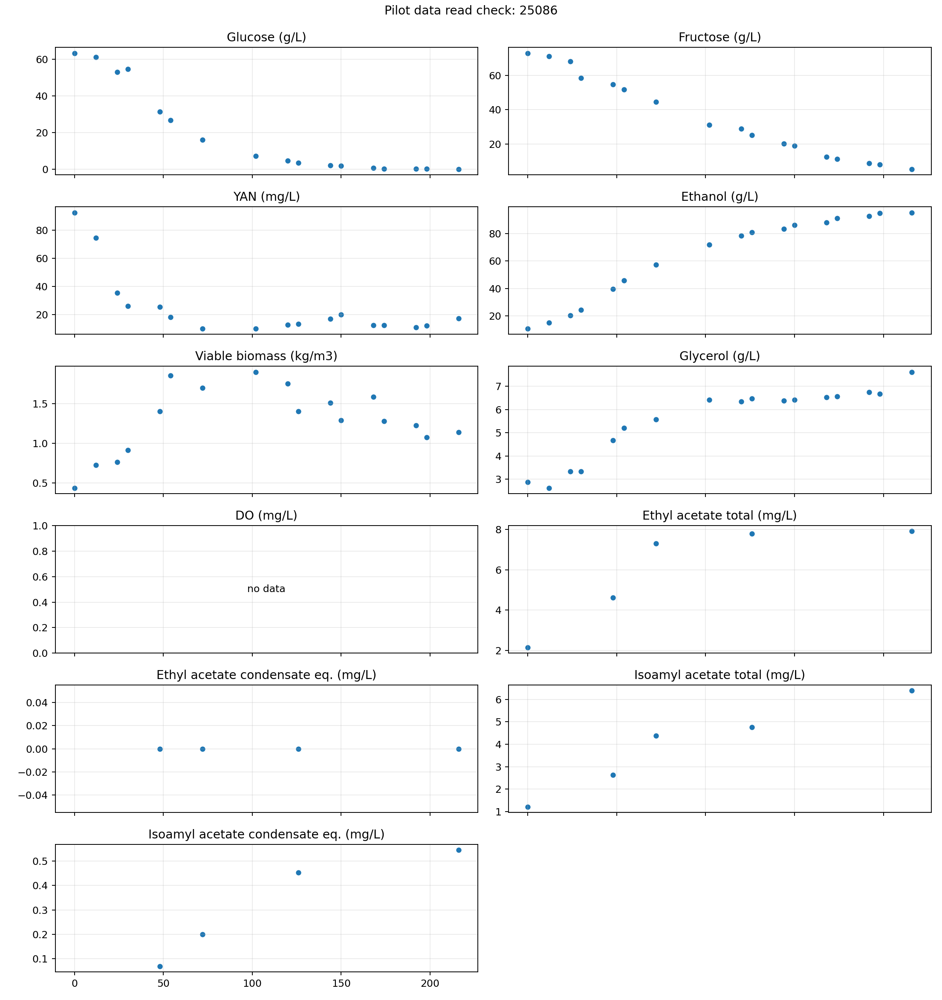

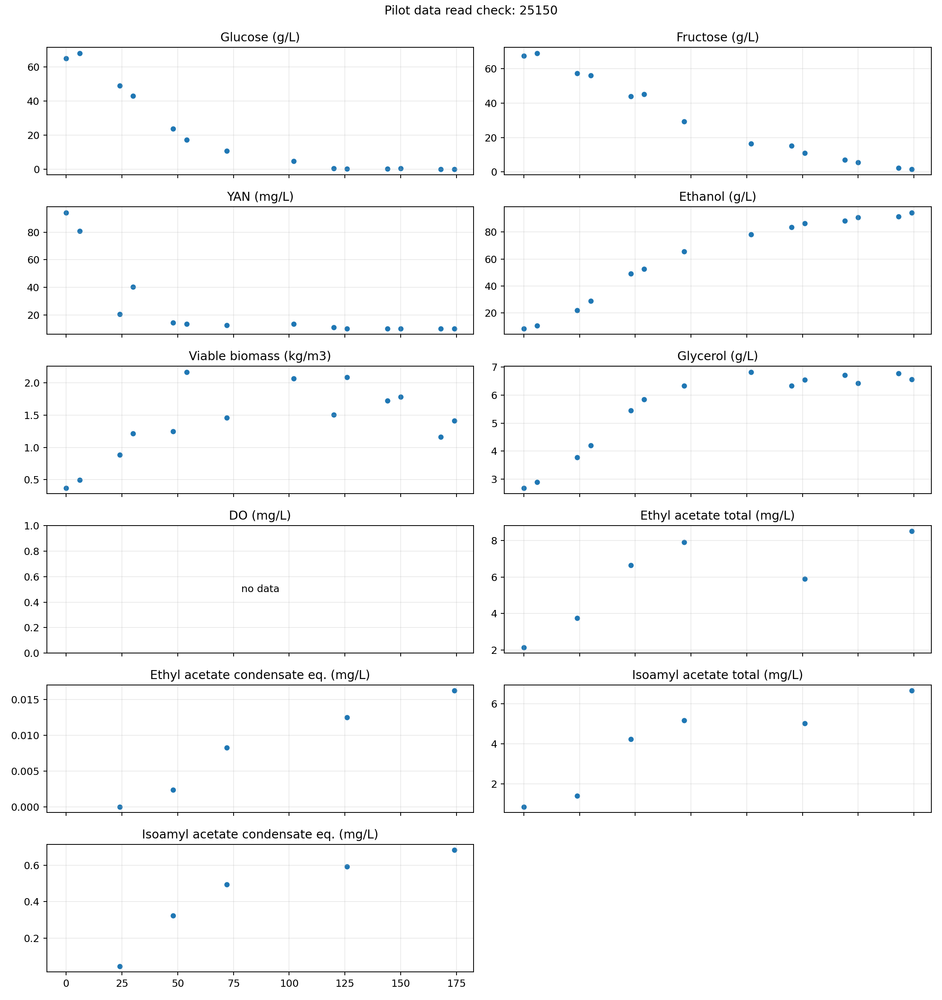

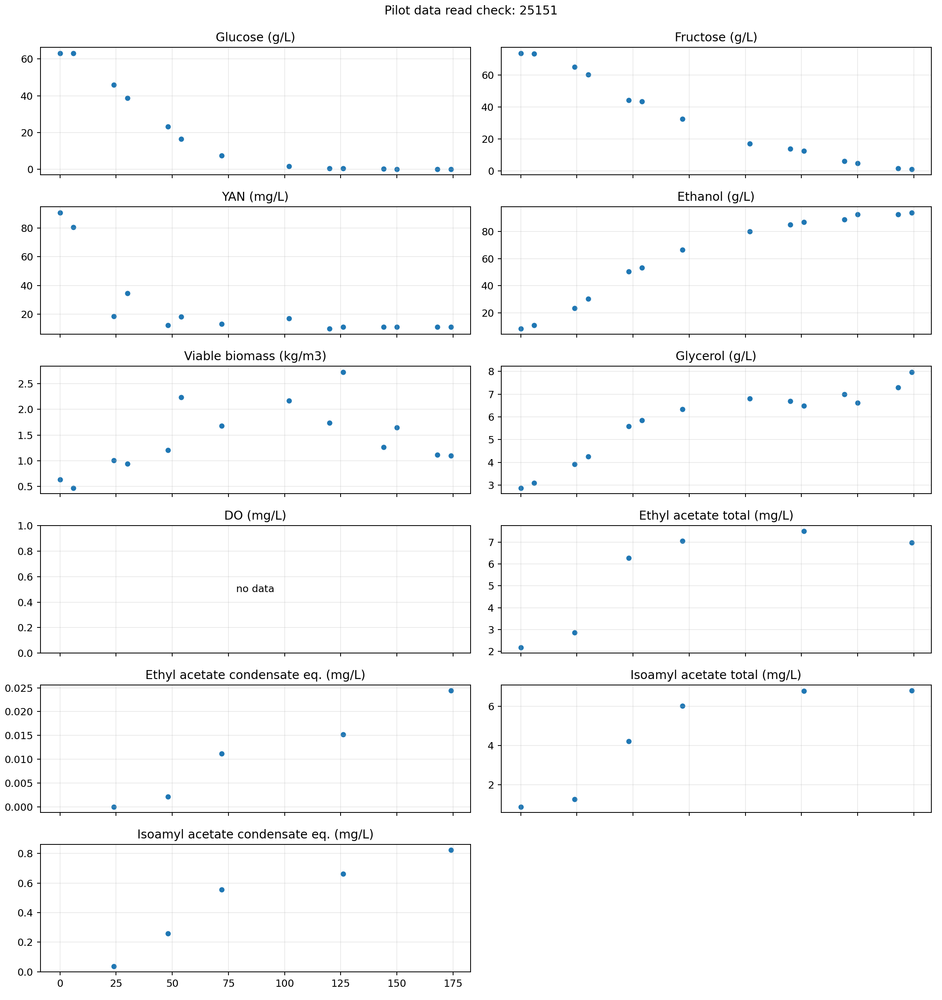

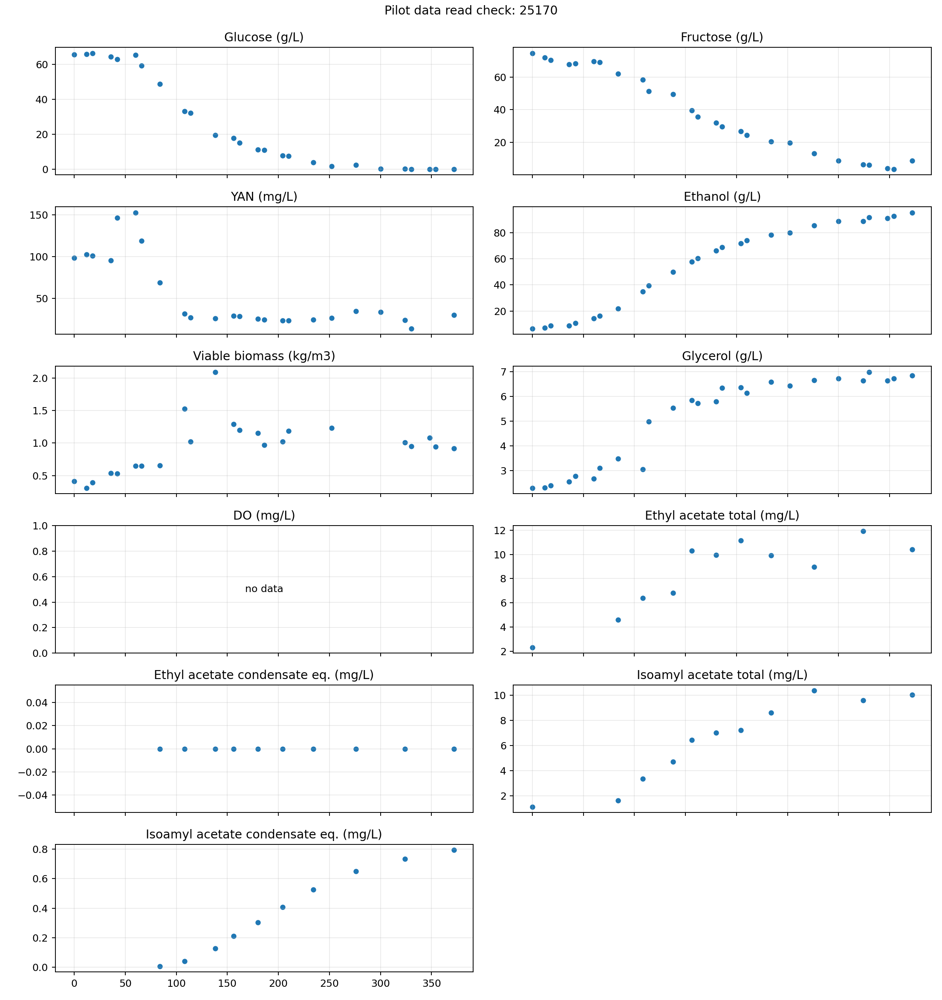

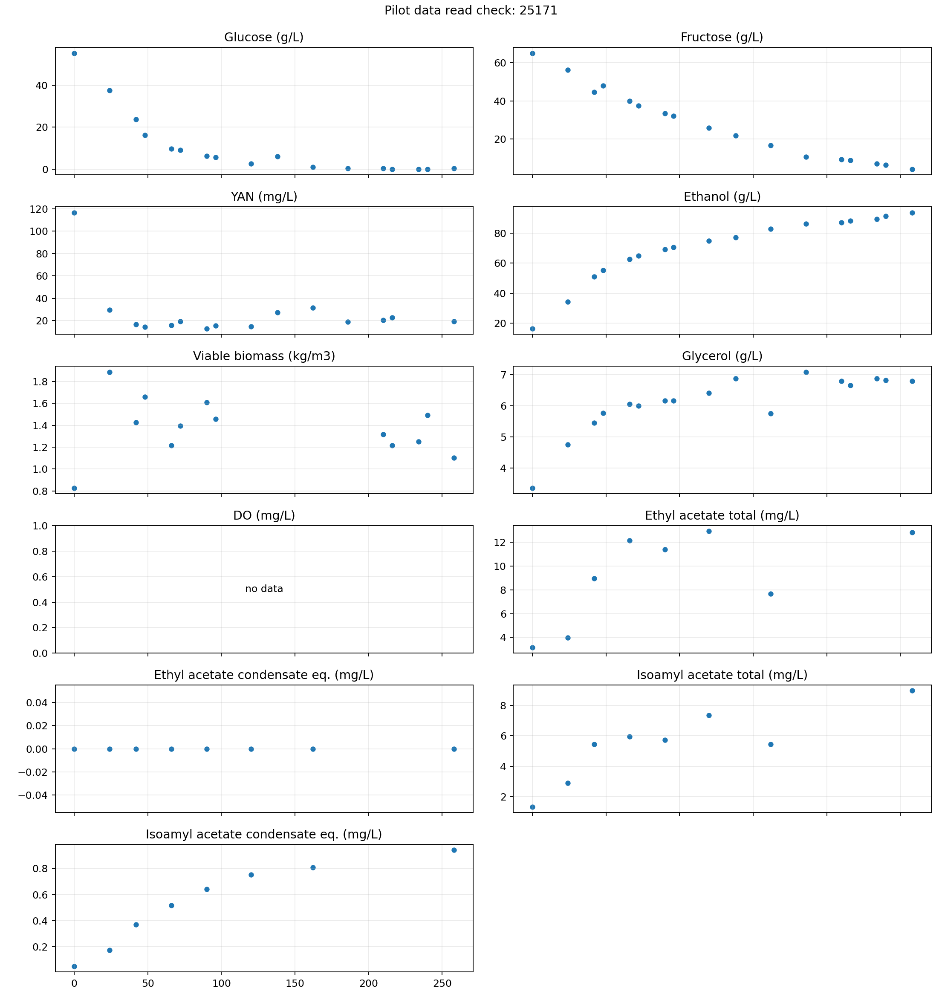

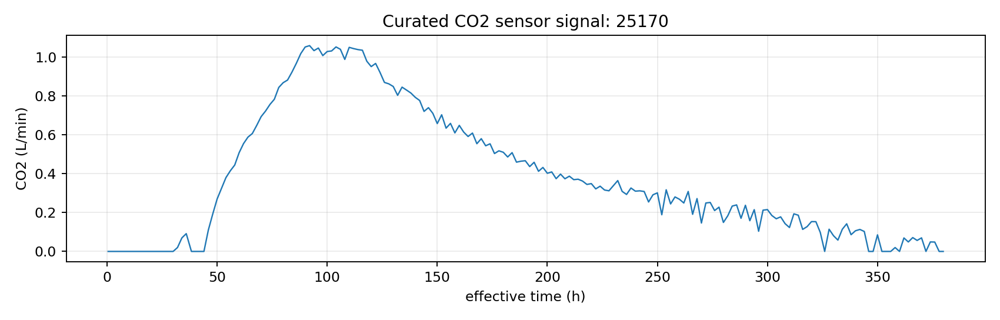

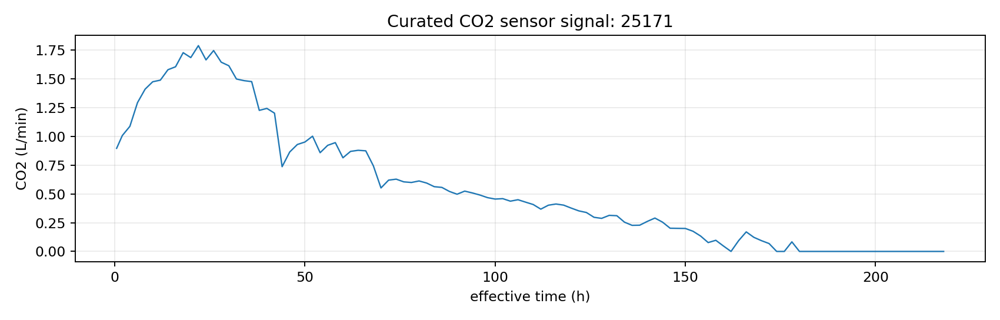

In [3]:
for path in sorted((PLOTS / 'data').glob('data_read_check_*.png')):
    display(Image(filename=str(path)))
for path in sorted((PLOTS / 'data').glob('co2_curated_*.png')):
    display(Image(filename=str(path)))


**Plain-language interpretation.** The workbook is read batch-by-batch, `25150` and `25151` CO2 files are excluded, and `25171` is restarted at the annotated `Pre reinoculo` sample. This makes the post-reinoculation segment the effective fermentation start instead of treating the non-viable inoculum period as model lag.

## 2. Initial simulation before CO2 reformulation

In [4]:
pd.read_csv(RESULTS / 'initial_fit_metrics.csv').sort_values(['group','relative_rmse']).head(40)

,group,n,rmse,mae,bias,obs_scale,relative_rmse,relative_bias,corr,state,species,state_pool,mode,batch,scale_factor_L_min_per_g_l_h
15,aroma,44,1.850425,1.326850,-0.649089,5.203077,0.355640,-0.124751,0.645314,NaN,isoamyl_acetate,retained,NaN,NaN,NaN
16,aroma,51,2.080309,1.385197,-0.819671,5.333877,0.390018,-0.153673,0.774635,NaN,isoamyl_acetate,total,NaN,NaN,NaN
10,aroma,51,3.494260,2.482058,-2.032748,7.676322,0.455200,-0.264808,0.626978,NaN,ethyl_acetate,total,NaN,NaN,NaN
13,aroma,51,0.025410,0.016617,-0.008598,0.045336,0.560479,-0.189650,0.627033,NaN,ethyl_octanoate,total,NaN,NaN,NaN
9,aroma,17,4.747046,3.784668,-3.590697,8.293908,0.572353,-0.432932,0.020974,NaN,ethyl_acetate,retained,NaN,NaN,NaN
12,aroma,44,0.021652,0.015793,-0.003492,0.034524,0.627146,-0.101145,0.355693,NaN,ethyl_octanoate,retained,NaN,NaN,NaN
14,aroma,44,0.589108,0.340426,-0.300985,0.698519,0.843368,-0.430890,0.465248,NaN,isoamyl_acetate,condensate,NaN,NaN,NaN
11,aroma,44,0.011719,0.007264,-0.006474,0.013427,0.872799,-0.482168,0.642548,NaN,ethyl_octanoate,condensate,NaN,NaN,NaN
8,aroma,17,0.068932,0.062477,0.062477,0.015920,4.329931,3.924456,0.465457,NaN,ethyl_acetate,condensate,NaN,NaN,NaN
18,co2,110,0.112814,0.081552,0.000637,NaN,0.252132,0.001424,0.977252,CO2_flow_L_min,NaN,NaN,instant,25171.0,3.517985


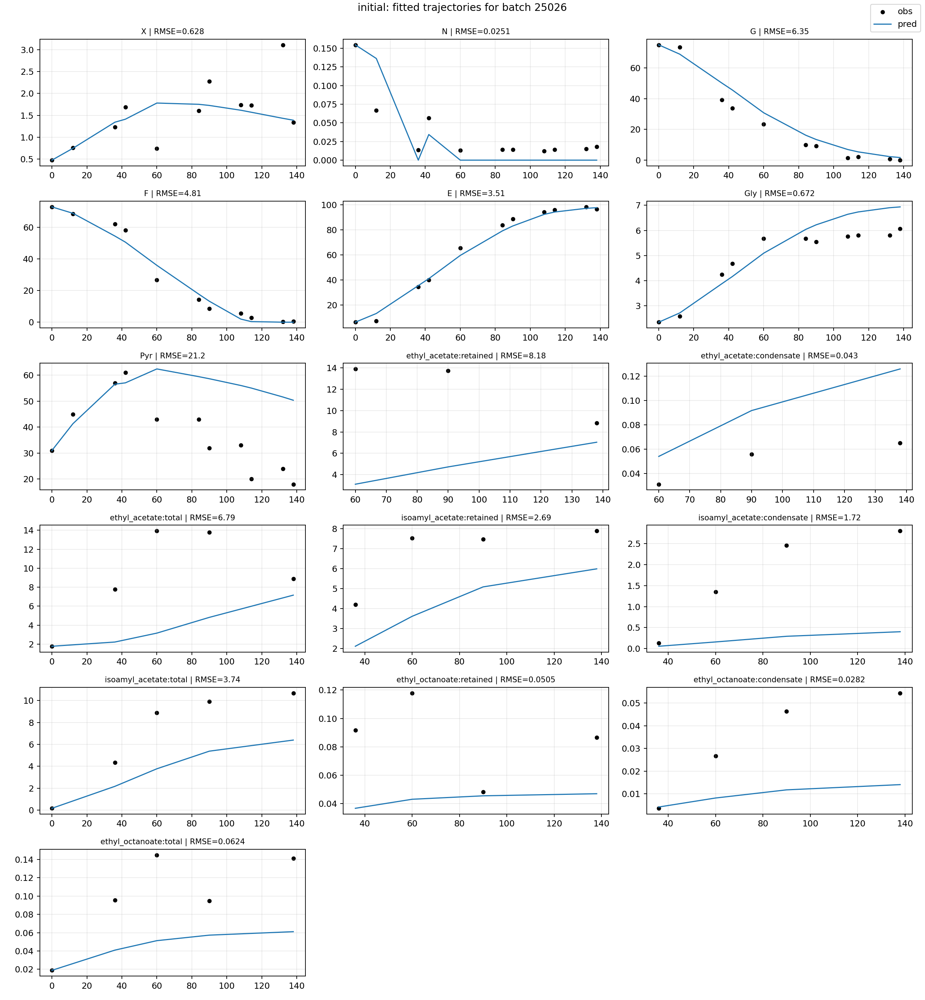

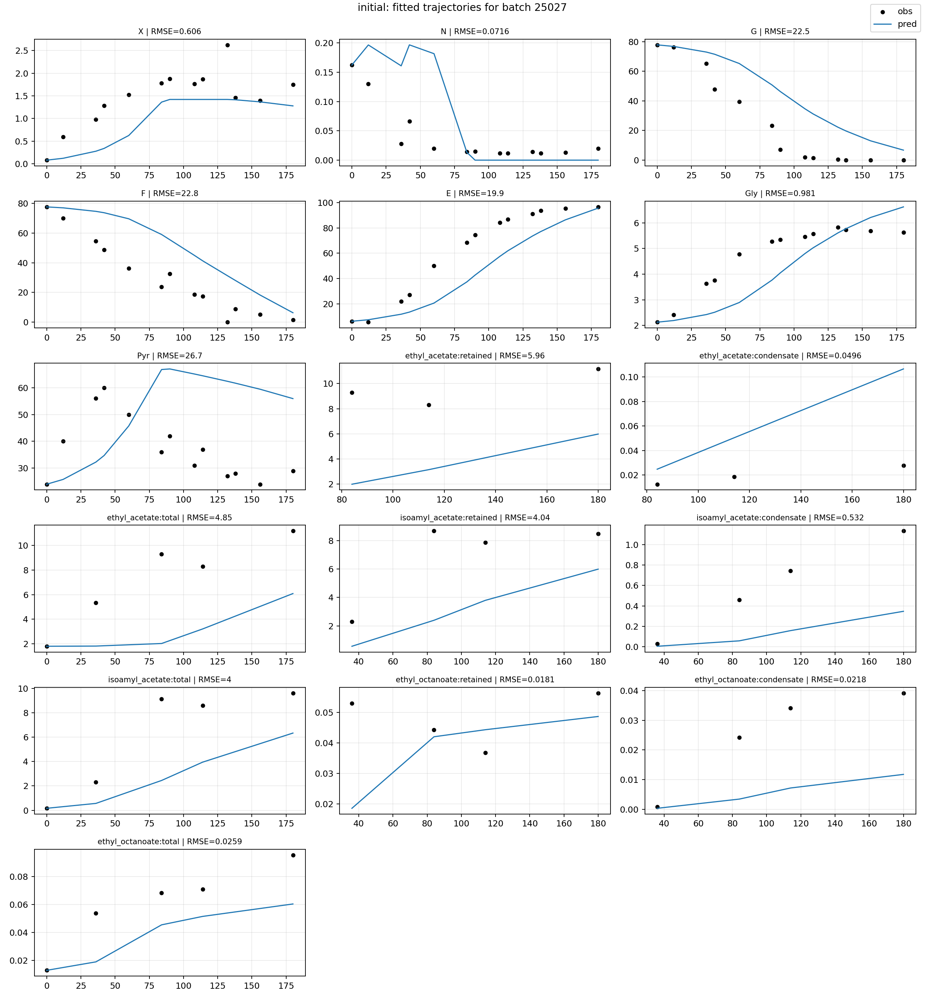

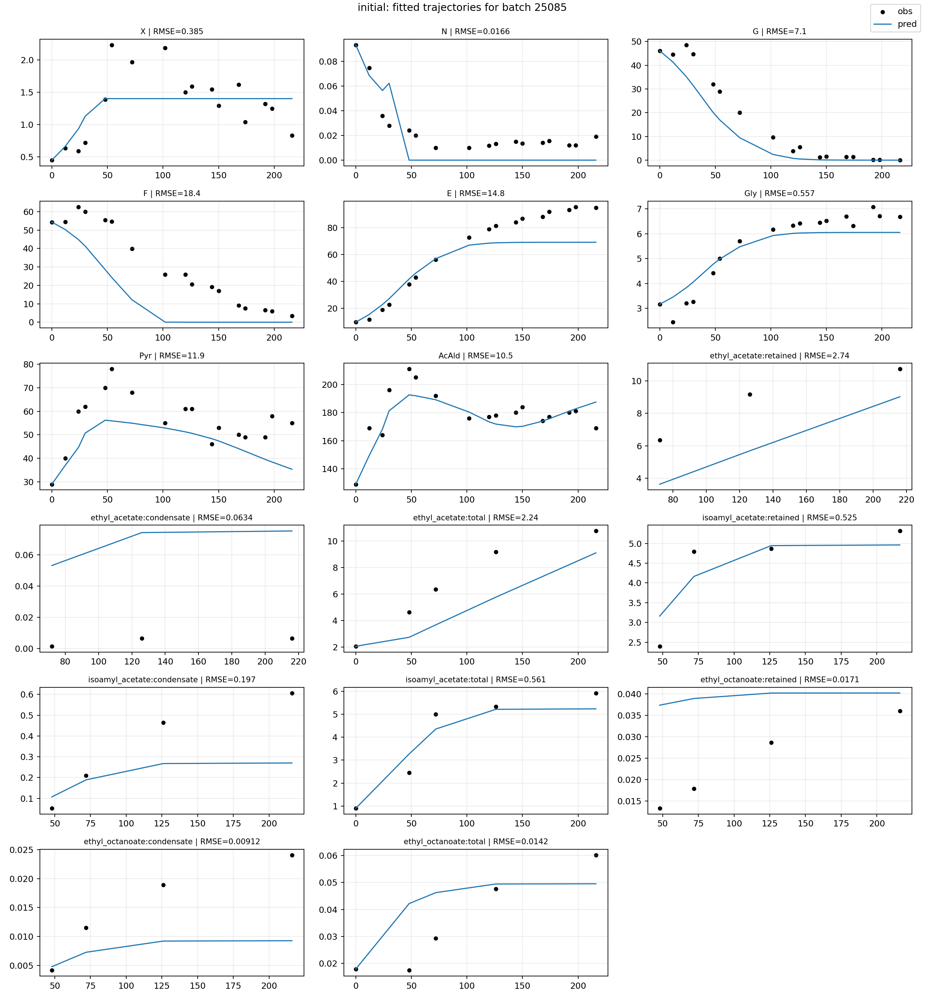

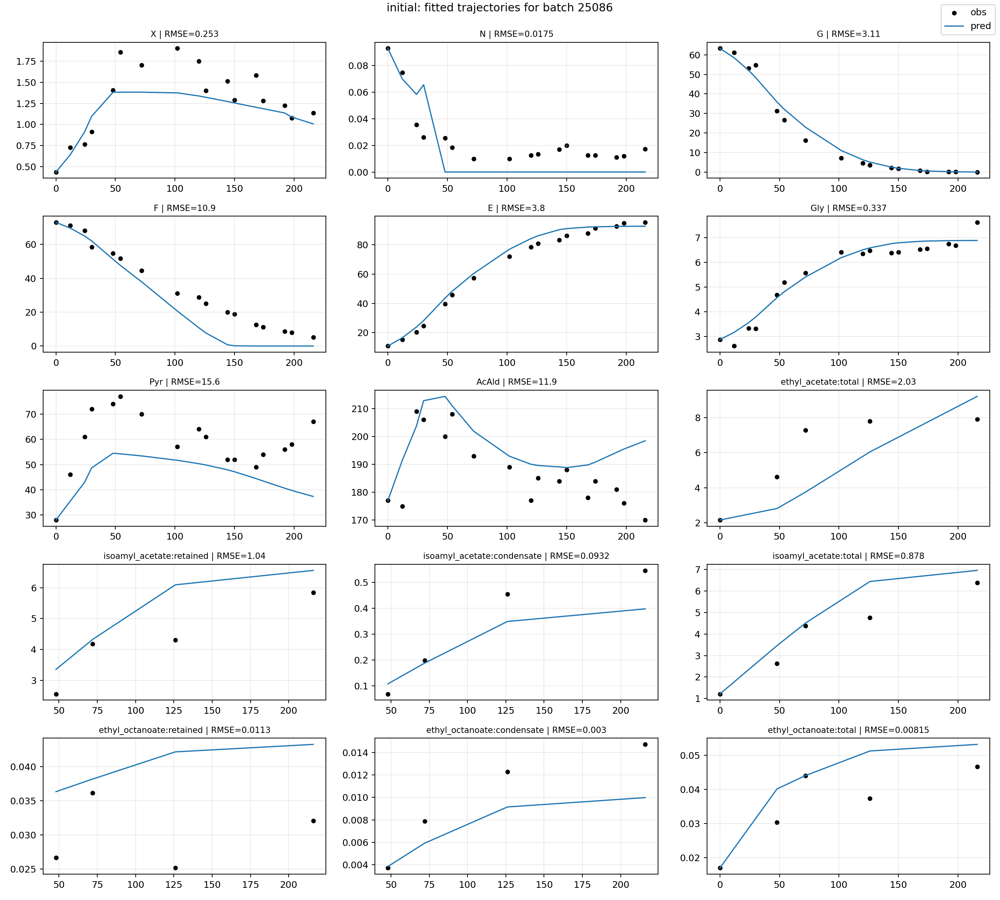

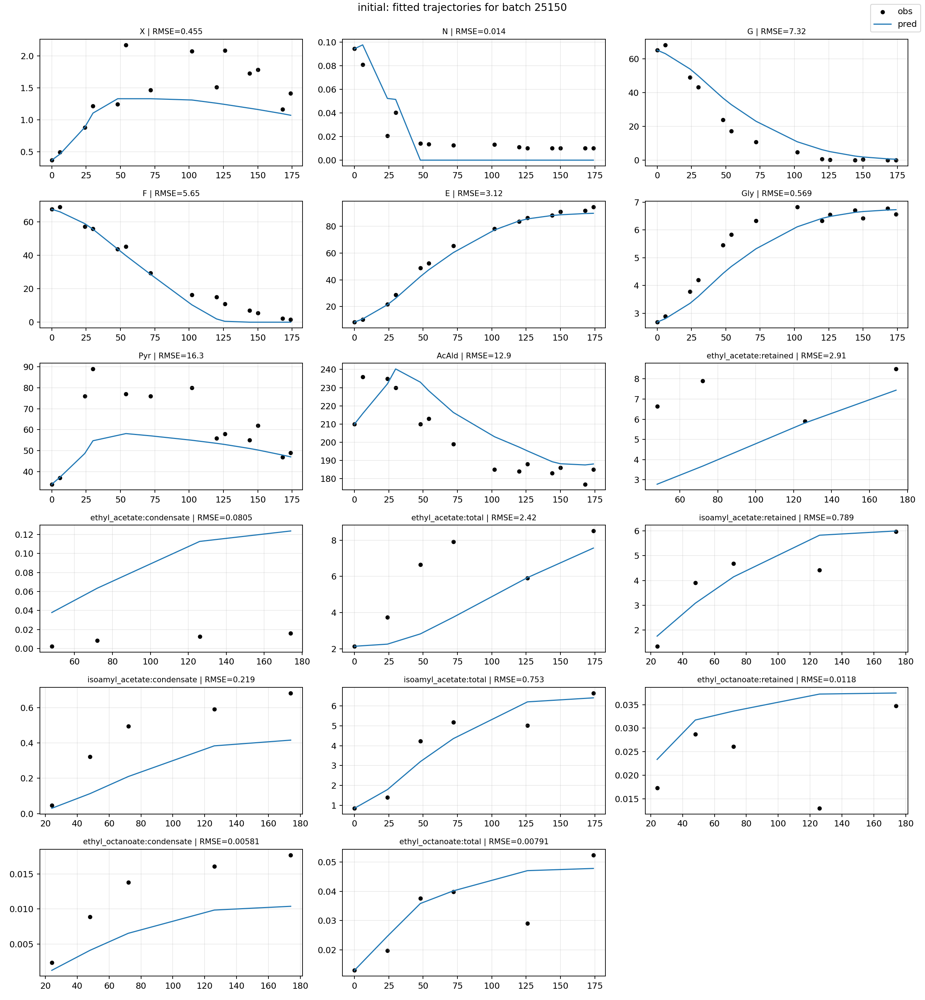

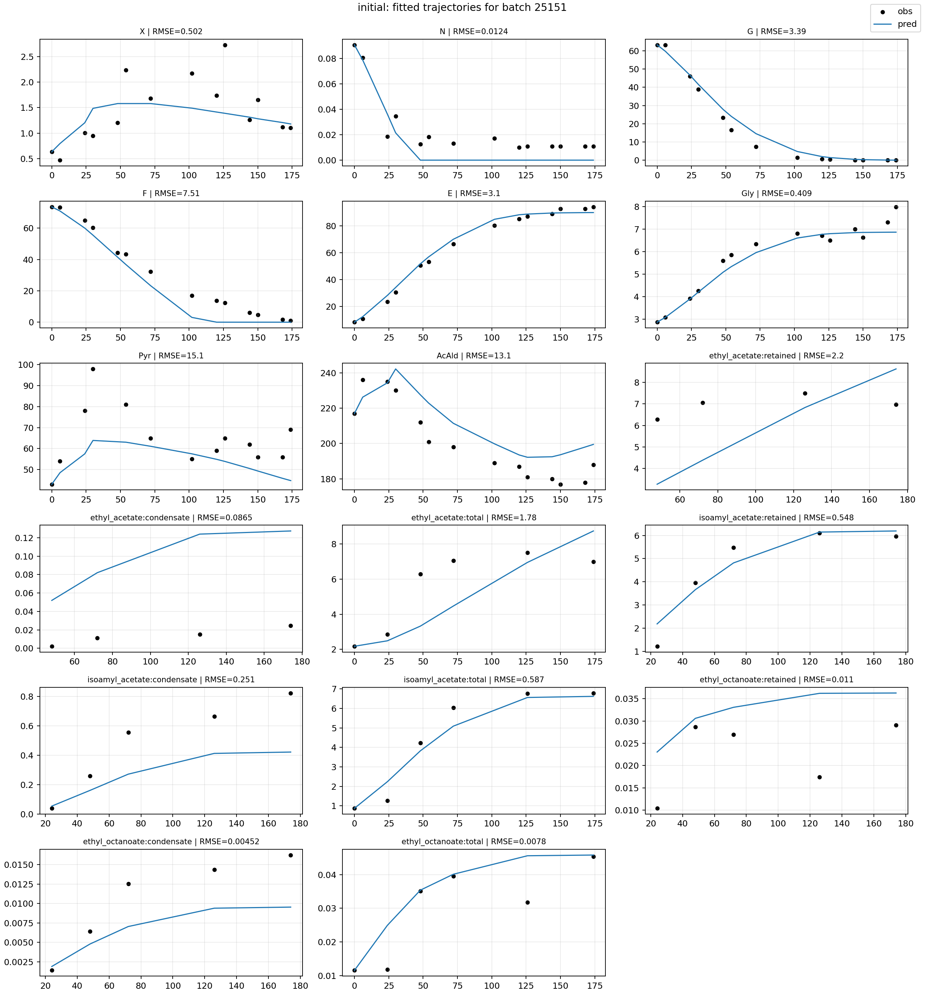

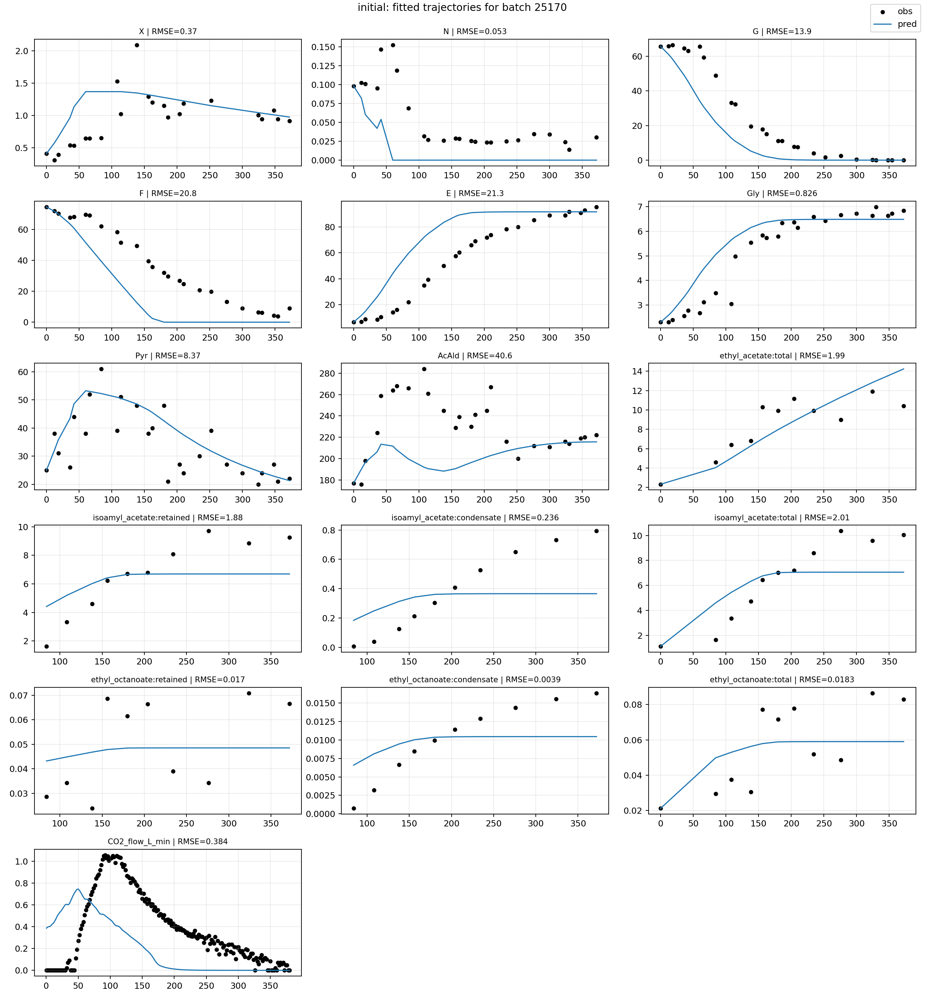

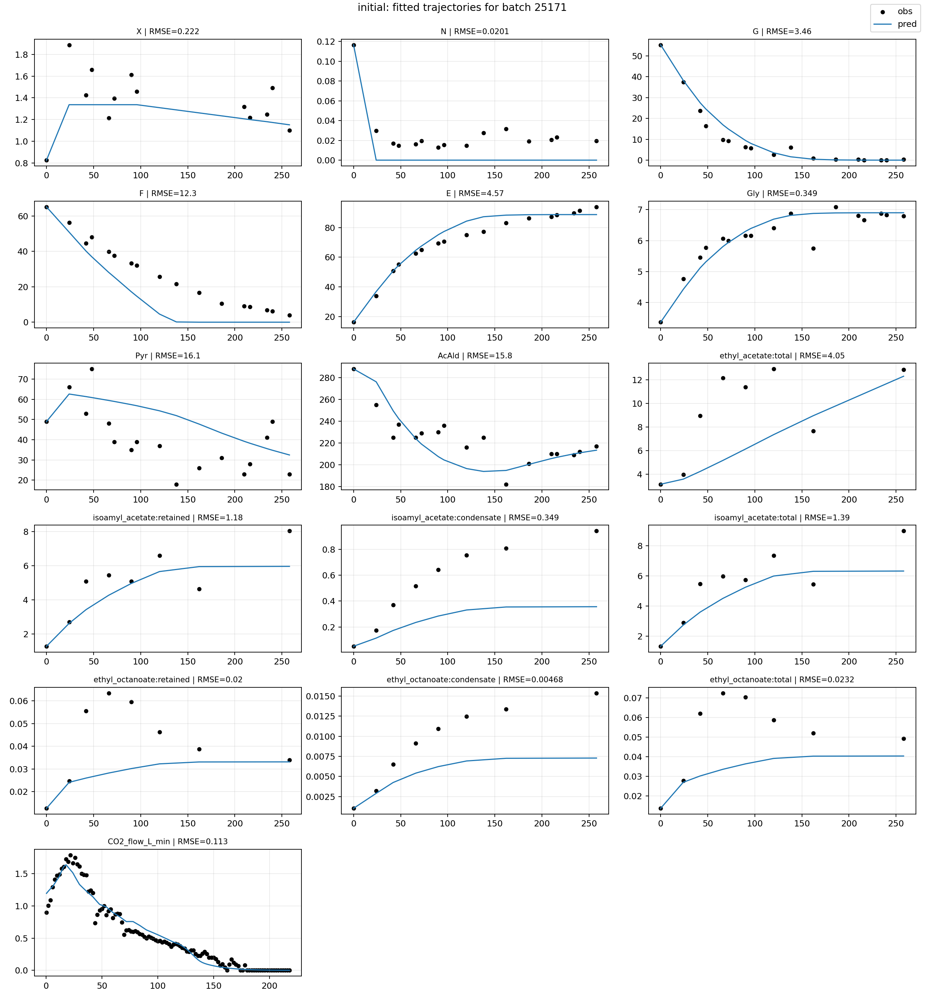

In [5]:
for path in sorted((PLOTS / 'initial_fit').glob('initial_fit_*.png')):
    display(Image(filename=str(path)))


**Plain-language interpretation.** This block is the reference fit before adding the dissolved-CO2 and macro-O2 states. If the model predicts CO2 release far earlier than the sensor while ethanol/sugar curves remain acceptable, the issue is not only gas-liquid solubility: the model is also assuming anaerobic ethanol/CO2 production from the start.

## 3. CO2 solubility, macro-O2 transition model and benchmark

The dissolved CO2 state is:

$$\frac{dC_{CO2,L}}{dt}=r_{CO2,prod}-r_{CO2,gas}$$

The original gas-source proxy is tied to ethanol production:

$$r_{CO2,prod}=\frac{44.01}{2\cdot46.07}r_E$$

The O2-gated candidates replace that source with:

$$r_{CO2,prod}^{eff}=r_{CO2,ferm}^{base}\left[f_C+(1-f_C)\phi_{ana}(O_2)\right]+r_{CO2,resp}$$

where the Crabtree floor \(f_C\) prevents aerobic conditions from fully shutting down fermentation at high sugar, and

$$\phi_{ana}(O_2)=\frac{K_{ana}^{n}}{K_{ana}^{n}+O_2^{n}}.$$

The macro-O2 state is initialized near air saturation for fresh must:

$$O_2(0)=O_2^*(T,E,G,F),$$

with a low effective fraction for batch 25171 because its new \(t=0\) is post-reinoculation after the original non-viable inoculum period. The state evolves as:

$$\frac{dO_2}{dt}=k_{La,O2}(O_2^*-O_2)-q_{O2}X\frac{O_2}{K_{O2}+O_2}.$$

The respiration contribution is kept stoichiometric and small:

$$r_{CO2,resp}=\frac{44.01}{32.00}\frac{q_{O2}X\,O_2}{1000(K_{O2}+O_2)}.$$

Gas release from the liquid still follows:

$$r_{CO2,gas}=k_{rel}\max(C_{CO2,L}-C^*_{CO2},0).$$

The saturation concentration is represented as a process correlation:

$$C^*_{CO2}=s_{CO2}\,1.69\exp[-0.032(T-20)]\exp(0.0016E)\exp[-0.0012(G+F)].$$

This is not a purely arbitrary lag. It is a two-stage physical/effective model: fresh must can contain oxygen that suppresses the anaerobic ethanol/CO2 source, then generated CO2 fills the dissolved pool before gas flow appears once the pool approaches supersaturation. The sensor reports \(L/min\), so each batch is allowed a linear scale factor from model specific release \((g/L/h)\) to measured gas flow.


In [6]:
pd.read_csv(RESULTS / 'co2_model_selection_summary.csv')

,mode,mechanistic_class,description,data_wsse,n_data_residuals,n_parameters,aicc,bic,active_bound_count,mean_relative_rmse,min_corr,params_json,selected,selection_penalty,selection_score
0,solubility_o2_slow_transition,o2_gated_dissolved_co2,O2-gated dissolved CO2 model with the effectiv...,124.653427,301,2,128.693695,136.067647,0,0.607008,0.842917,"{""kCO2_release_h"": 0.2669276959271604, ""CO2sat...",True,0.0,136.067647
1,solubility_o2_qfit,o2_gated_dissolved_co2,"Same O2-gated dissolved CO2 model, but the eff...",124.653550,301,3,130.734358,141.774881,1,0.607003,0.842901,"{""kCO2_release_h"": 0.26702581875198395, ""CO2sa...",False,35.0,176.774881
2,old_lag_threshold,empirical_effective,Previous effective lag-threshold model used as...,163.447615,301,2,167.487884,174.861836,1,0.707377,0.649529,"{""qgas_tau_h"": 47.960053368763646, ""qgas_thres...",False,43.0,217.861836
3,solubility_o2_literature,o2_gated_dissolved_co2,Dissolved CO2 buffer with a literature-informe...,232.305871,301,2,236.346140,243.720092,0,0.808934,0.507003,"{""kCO2_release_h"": 0.17835568974142976, ""CO2sa...",False,0.0,243.720092
4,solubility_scaled,dissolved_co2,Dissolved CO2 buffer with fitted release rate ...,241.486599,301,2,245.526868,252.900820,0,0.808783,0.421614,"{""kCO2_release_h"": 0.2482212466616185, ""CO2sat...",False,0.0,252.900820
5,solubility_fixed,dissolved_co2,Dissolved CO2 buffer with literature saturatio...,254.584402,301,1,256.597780,260.291512,0,0.829747,0.383849,"{""kCO2_release_h"": 1.2804272665214722, ""CO2sat...",False,0.0,260.291512
6,instant,rate_proxy,CO2 sensor flow is proportional to instantaneo...,240.788377,301,0,242.801755,246.495488,0,0.747604,0.327824,{},False,25.0,271.495488


In [7]:
pd.read_csv(RESULTS / 'co2_metrics_selected.csv')

,mode,batch,n,scale_factor_L_min_per_g_l_h,rmse_L_min,mae_L_min,bias_L_min,relative_rmse,relative_bias,corr,params_json
0,solubility_o2_slow_transition,25170,191,3.682892,0.240347,0.197121,-0.135401,0.778980,-0.438844,0.842917,"{""kCO2_release_h"": 0.2669276959271604, ""CO2sat..."
1,solubility_o2_slow_transition,25171,110,3.589089,0.194652,0.117158,-0.011368,0.435037,-0.025407,0.931167,"{""kCO2_release_h"": 0.2669276959271604, ""CO2sat..."


In [8]:
pd.read_csv(RESULTS / 'o2_macro_diagnostics_selected.csv').head(30)

,batch,time_h,O2_mg_l,O2_uptake_mg_l_h,anaerobic_gate,fermentative_fraction,qCO2_base_g_l_h,qCO2_effective_g_l_h,CO2_dissolved_g_l,CO2_saturation_g_l,qgas_g_l_h
0,25170,0.00,7.377836,0.059847,0.010228,0.089410,0.198168,0.017800,0.000000,0.586955,0.000000e+00
1,25170,0.25,7.362874,0.060389,0.010269,0.089448,0.199002,0.017883,0.004450,0.590851,3.130337e-20
2,25170,0.50,7.347777,0.060929,0.010311,0.089486,0.199801,0.017963,0.008921,0.594774,3.242398e-20
3,25170,0.75,7.332545,0.061466,0.010354,0.089525,0.200565,0.018040,0.013412,0.598723,3.357149e-20
4,25170,1.00,7.317178,0.062000,0.010397,0.089565,0.201292,0.018114,0.017922,0.602699,3.474393e-20
5,25170,1.25,7.301678,0.062531,0.010440,0.089605,0.201982,0.018185,0.022450,0.606702,3.593894e-20
6,25170,1.50,7.286045,0.063058,0.010485,0.089646,0.202634,0.018252,0.026996,0.610731,3.715379e-20
7,25170,1.75,7.270281,0.063581,0.010530,0.089687,0.203247,0.018316,0.031559,0.614788,3.838534e-20
8,25170,2.00,7.254386,0.064100,0.010576,0.089730,0.203821,0.018377,0.036138,0.618873,3.963003e-20
9,25170,2.25,7.238361,0.064615,0.010622,0.089772,0.204355,0.018434,0.040733,0.622985,4.088390e-20


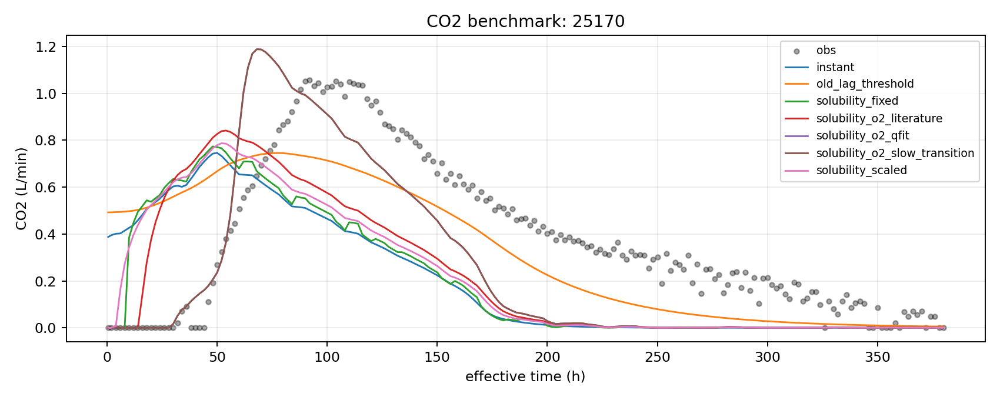

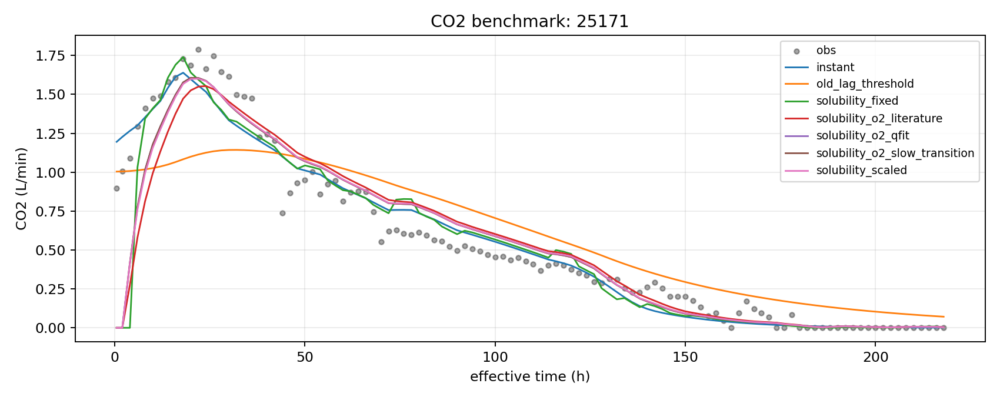

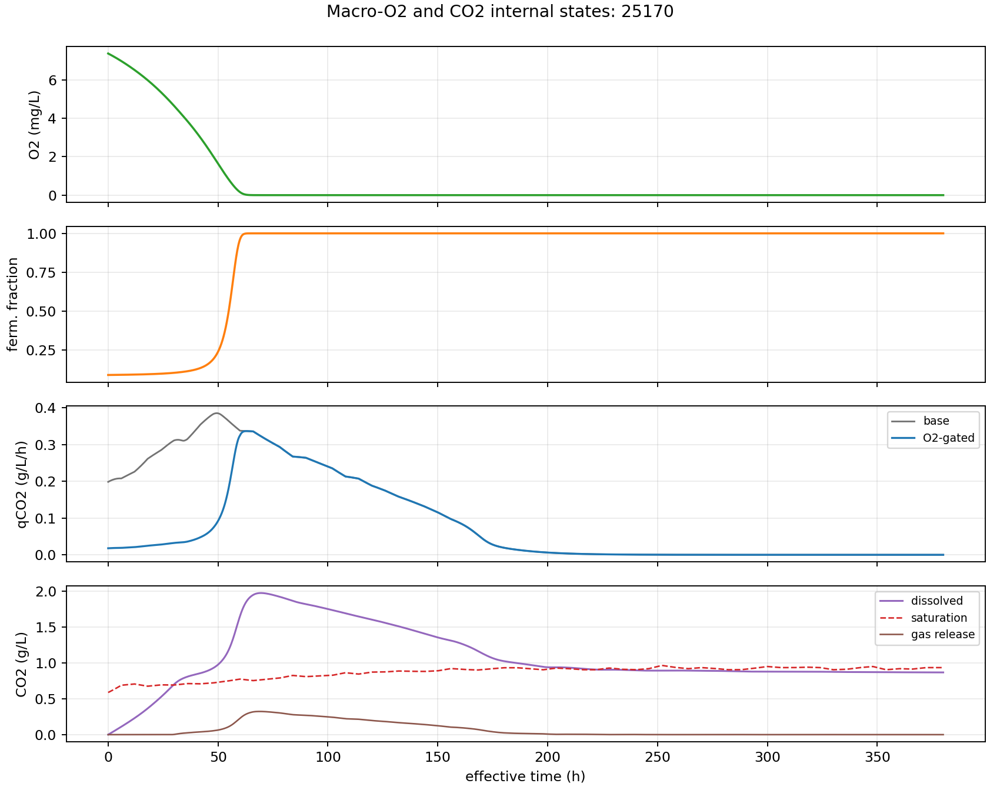

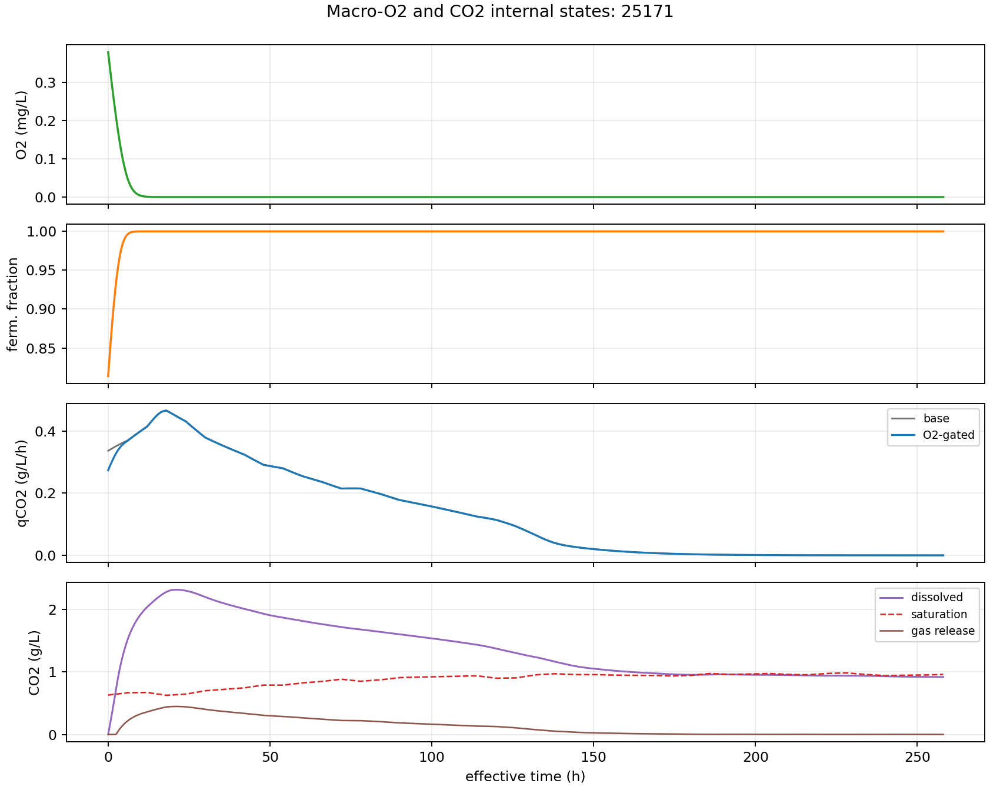

In [9]:
for path in sorted((PLOTS / 'co2_benchmark').glob('co2_benchmark_*.png')):
    display(Image(filename=str(path)))
for path in sorted((PLOTS / 'o2_macro').glob('o2_macro_*.png')):
    display(Image(filename=str(path)))


**Plain-language interpretation.** The selected model is `solubility_o2_slow_transition`. Its benchmark row has BIC `136.07`, data WSSE `124.65`, and selection score `136.07`. The O2-gated candidates are accepted only if they improve early CO2 timing without requiring active parameter bounds or a purely empirical lag.

## 4. Integrated post-CO2 calibration and validation

In [10]:
pd.read_csv(RESULTS / 'fit_integrated_selected.csv')

,mode,start,success,status,message,nfev,initial_objective_wsse,final_objective_wsse,data_wsse,n_data_residuals,...,k_EA_stationary,k_IAA_growth,k_IAA_stationary,k_EO_growth,k_EO_stationary,alpha_EA_loss,alpha_IAA_loss,alpha_EO_loss,k_EA_XE,k_EA_XE_Nlim
0,solubility_o2_slow_transition,0,False,0,The maximum number of function evaluations is ...,1,6572.15197,6572.15197,6572.151968,664,...,0.005947,0.053515,0.040084,0.000898,0.00015,0.2002,0.660648,1.478193,0.000011,0.041786


In [11]:
pd.read_csv(RESULTS / 'theta_selected_integrated.csv', index_col=0).head(100)

,0
mu0,0.068971
sN,8.751446
qN,0.015772
qXG,0.081491
qXF,0.070933
betaG0,1.186336
sG,0.097455
betaF0,0.314510
sF,0.178295
qEG,1.112514


In [12]:
pd.read_csv(RESULTS / 'final_fit_metrics.csv').sort_values(['group','relative_rmse']).head(60)

,group,n,rmse,mae,bias,obs_scale,relative_rmse,relative_bias,corr,state,species,state_pool,mode,batch,scale_factor_L_min_per_g_l_h
15,aroma,44,1.832993,1.322853,-0.575024,5.203077,0.352290,-0.110516,0.642550,NaN,isoamyl_acetate,retained,NaN,NaN,NaN
16,aroma,51,2.080309,1.385197,-0.819671,5.333877,0.390018,-0.153673,0.774635,NaN,isoamyl_acetate,total,NaN,NaN,NaN
10,aroma,51,3.494259,2.482056,-2.032746,7.676322,0.455200,-0.264807,0.626978,NaN,ethyl_acetate,total,NaN,NaN,NaN
13,aroma,51,0.025410,0.016617,-0.008598,0.045336,0.560479,-0.189650,0.627033,NaN,ethyl_octanoate,total,NaN,NaN,NaN
9,aroma,17,4.720987,3.753630,-3.555506,8.293908,0.569211,-0.428689,0.020233,NaN,ethyl_acetate,retained,NaN,NaN,NaN
12,aroma,44,0.021678,0.016903,-0.000499,0.034524,0.627917,-0.014455,0.333824,NaN,ethyl_octanoate,retained,NaN,NaN,NaN
14,aroma,44,0.630224,0.389988,-0.375049,0.698519,0.902229,-0.536921,0.469613,NaN,isoamyl_acetate,condensate,NaN,NaN,NaN
11,aroma,44,0.014064,0.009608,-0.009467,0.013427,1.047484,-0.705073,0.499400,NaN,ethyl_octanoate,condensate,NaN,NaN,NaN
8,aroma,17,0.039527,0.030431,0.027288,0.015920,2.482863,1.714100,0.503058,NaN,ethyl_acetate,condensate,NaN,NaN,NaN
18,co2,110,0.194652,0.117158,-0.011368,NaN,0.435037,-0.025407,0.931167,CO2_flow_L_min,NaN,NaN,solubility_o2_slow_transition,25171.0,3.589089


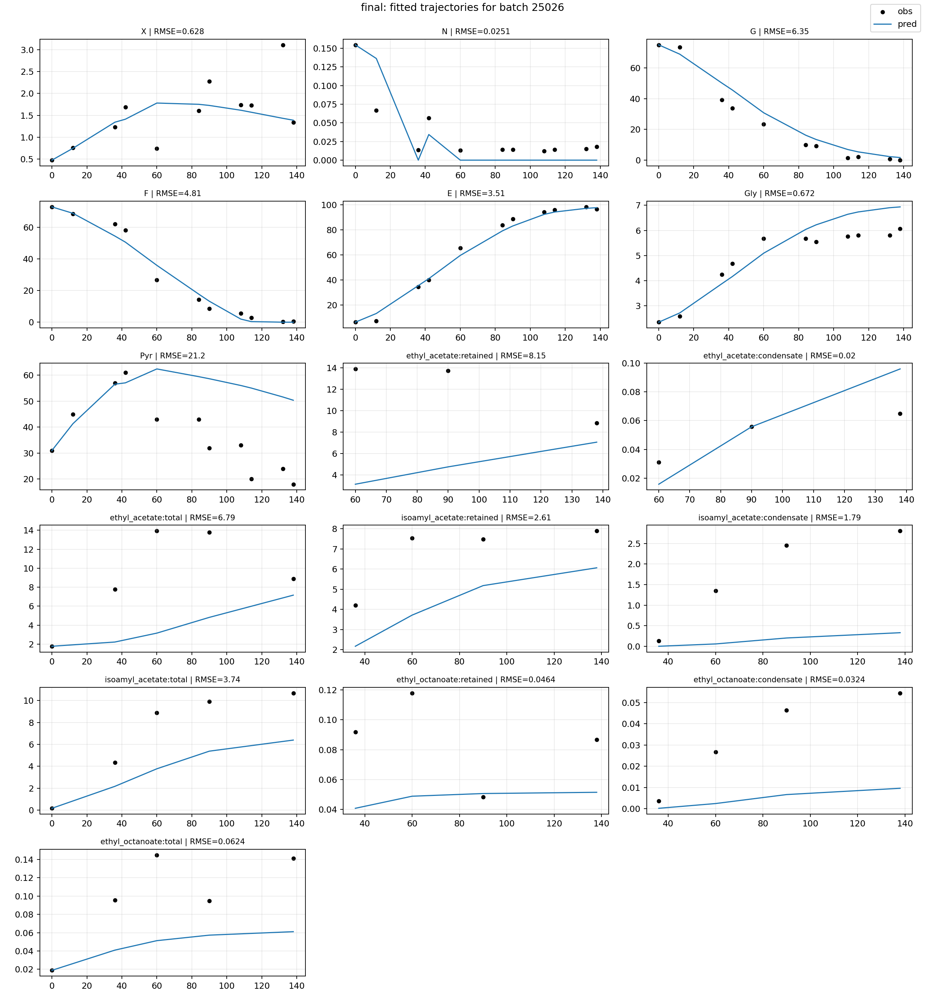

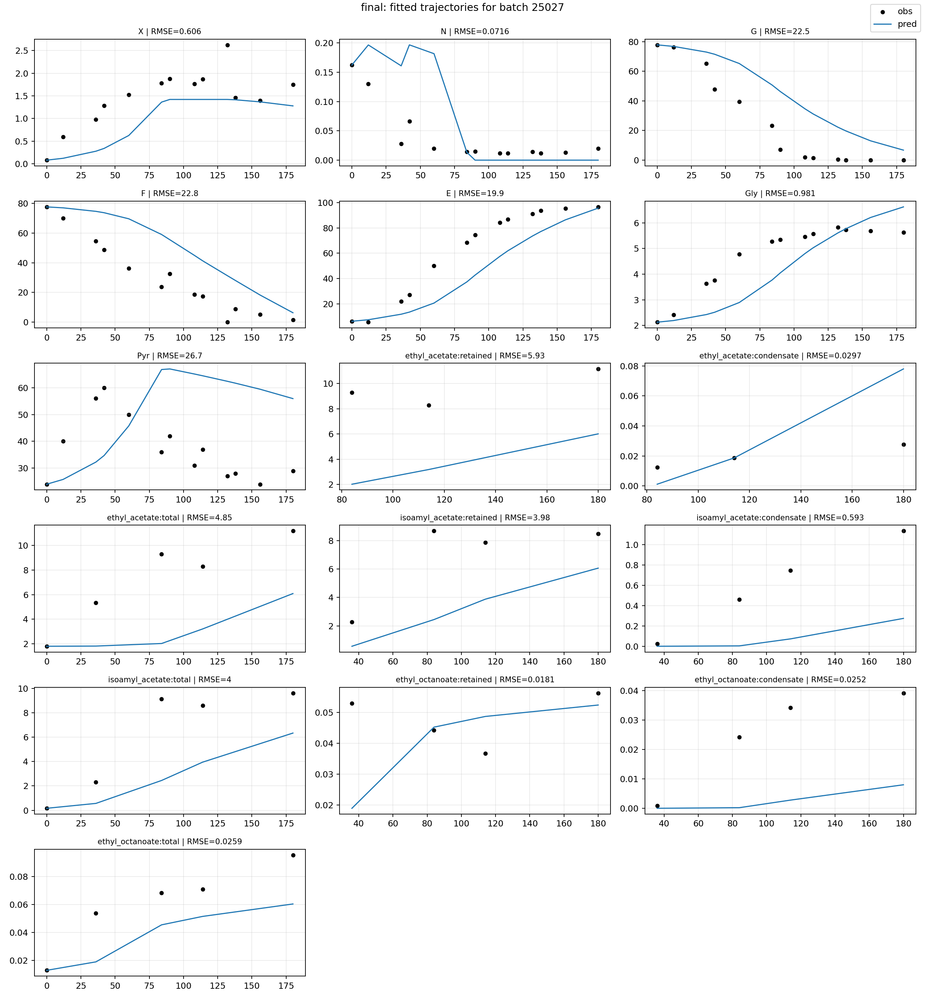

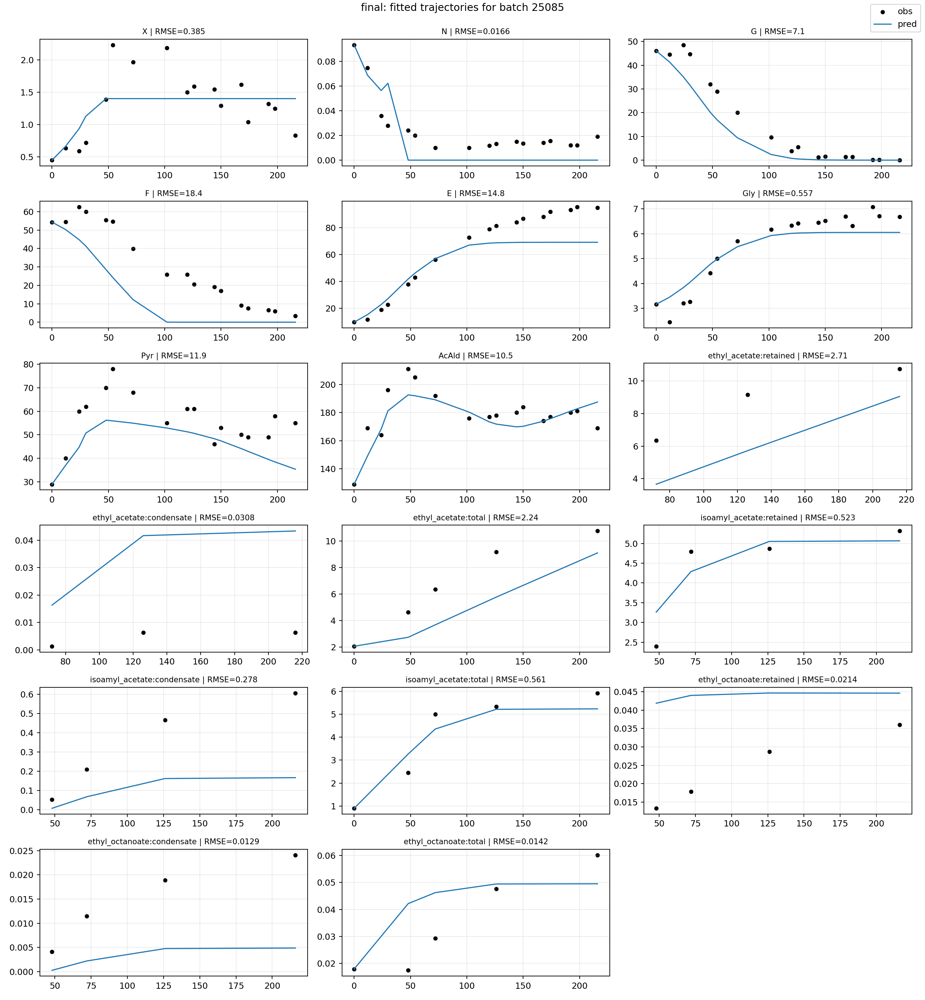

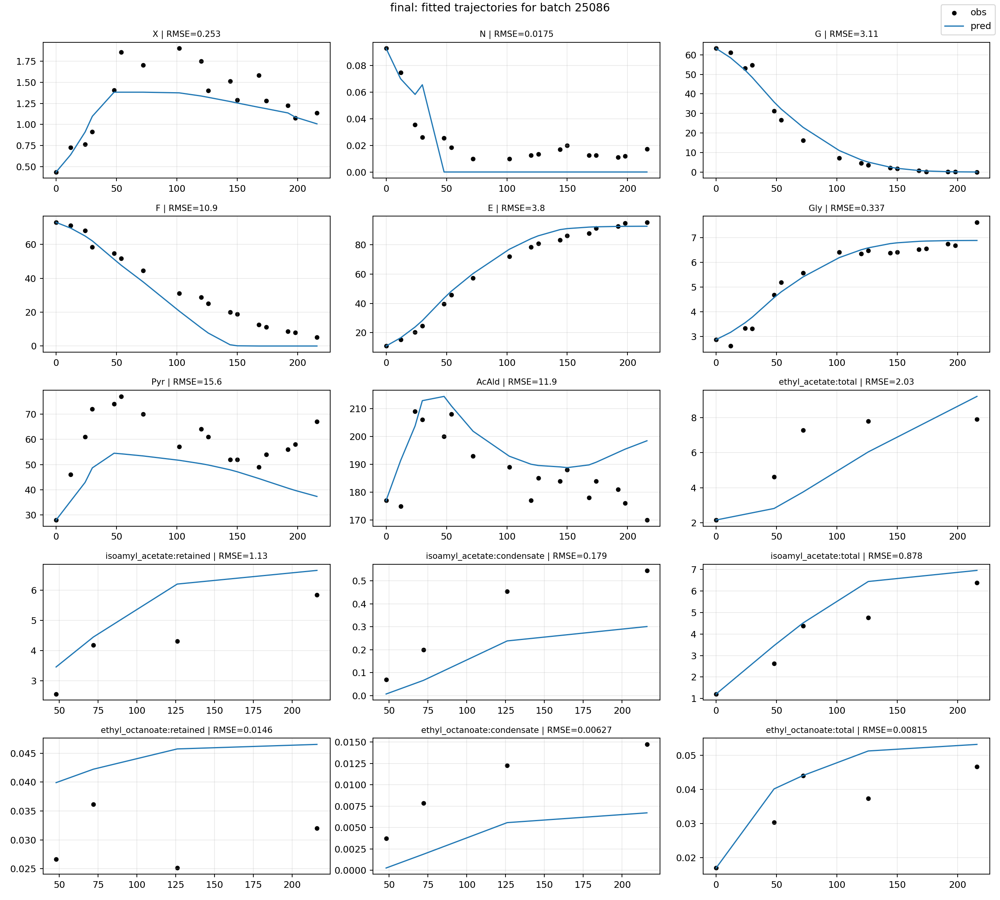

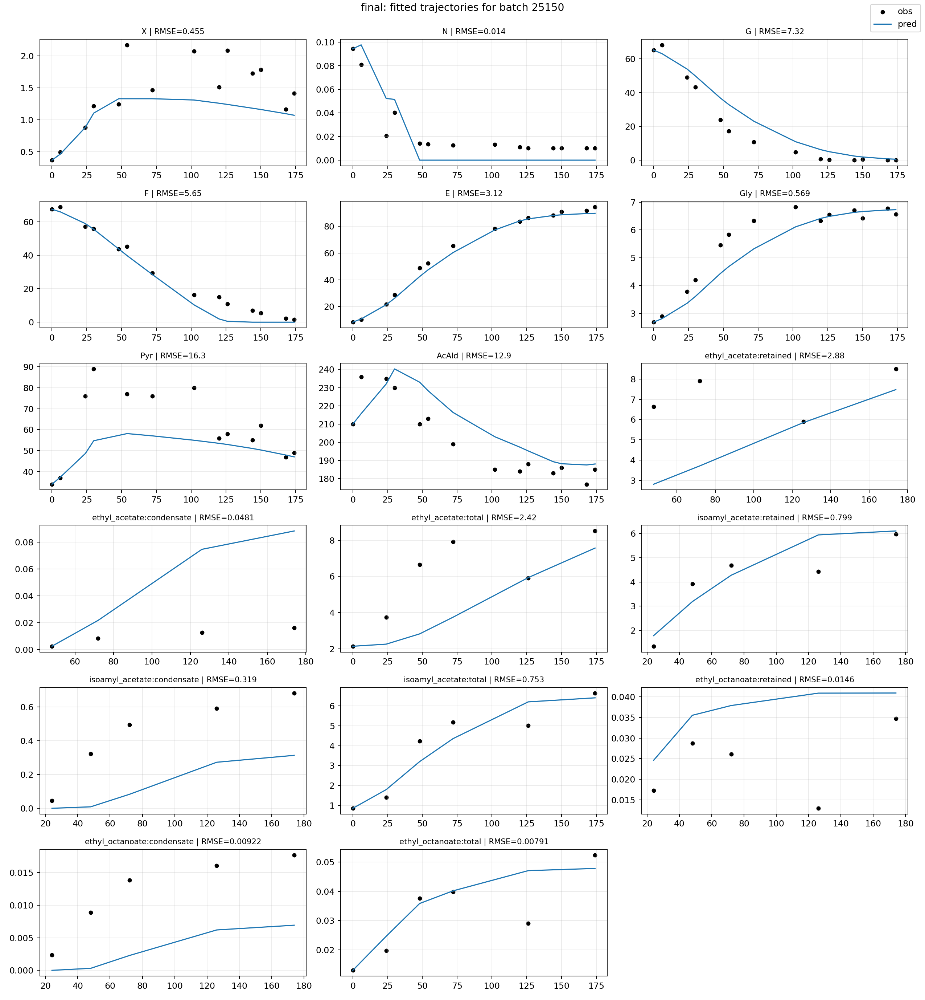

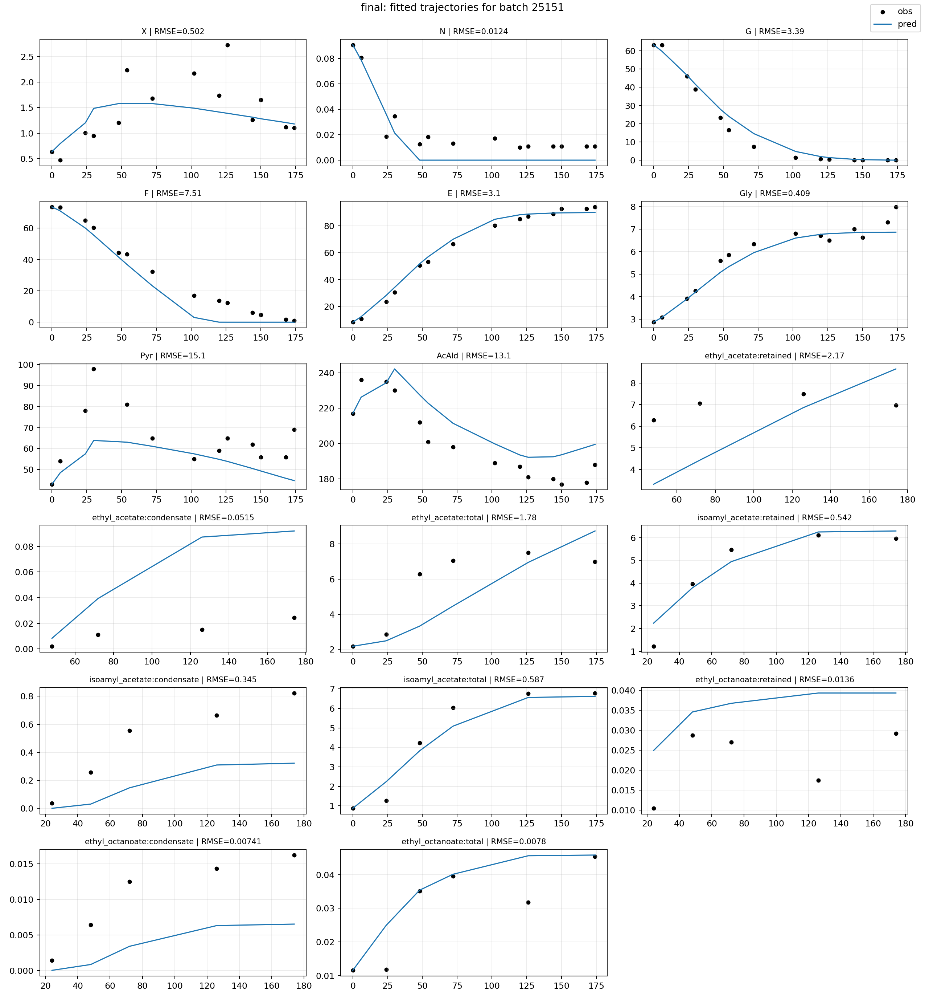

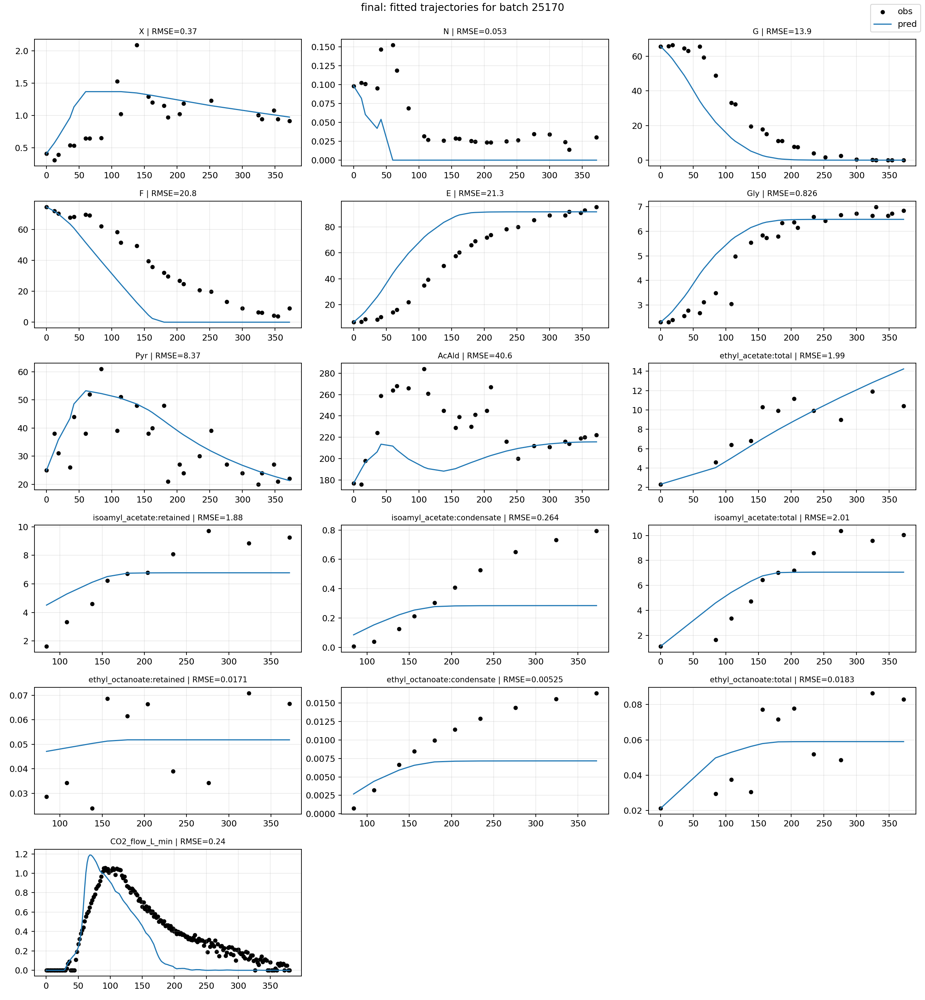

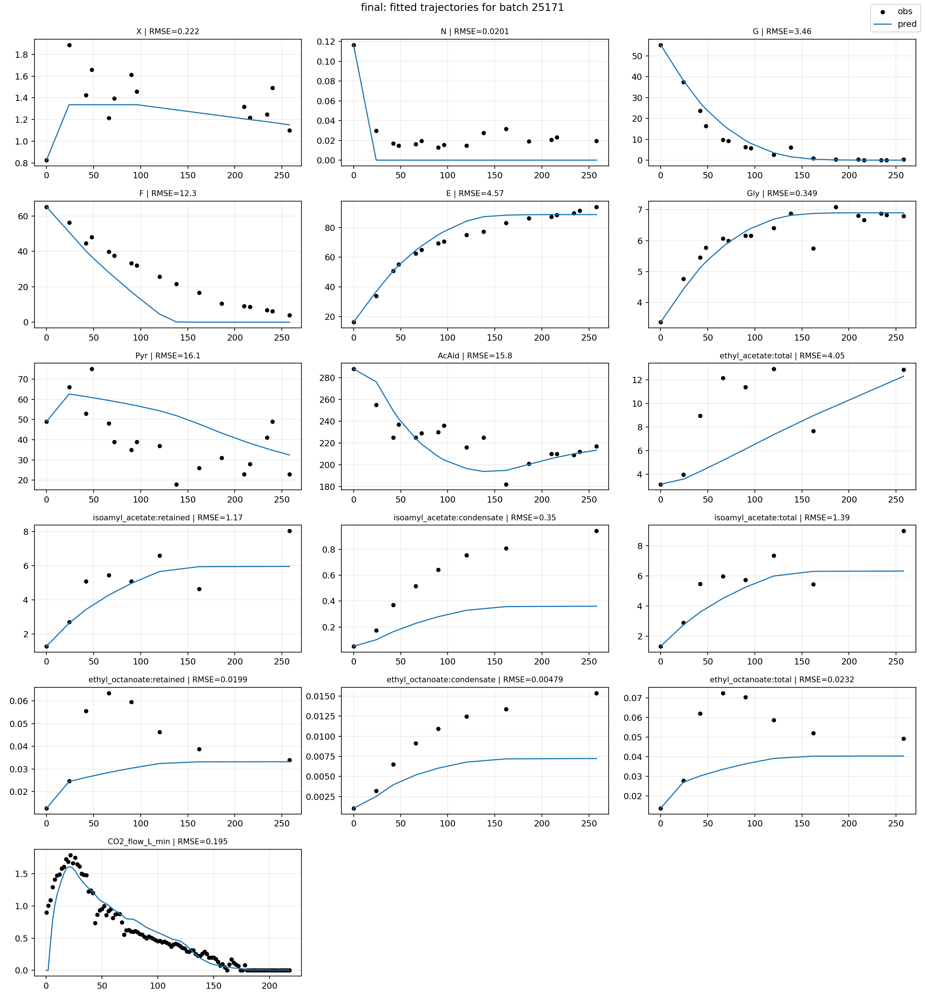

In [13]:
for path in sorted((PLOTS / 'final_fit').glob('final_fit_*.png')):
    display(Image(filename=str(path)))


**Plain-language interpretation.** The integrated fit adjusts the selected aroma parameters while keeping the step-0 CO2 solubility parameters fixed. This prevents aroma residuals from moving the physical CO2 buffer to a non-physical boundary. Good retained-aroma fit but poor condensate fit indicates a partition/stripping issue; poor retained and total fit indicates a synthesis-kinetics issue.

## 5. CO2/O2 FIM, eigenvalues and estimability

The full coupled FIM, including all aroma states, is computationally expensive because each finite-difference perturbation must reintegrate liquid/condensate aroma partition. For this O2-structure iteration, the notebook reports a focused CO2/O2 Fisher Information Matrix for the selected gas-transfer parameters. This is the correct diagnostic for deciding whether the new O2-gated gas model improves the online CO2 direction.

The current-data Fisher Information Matrix is computed by finite differences in log-parameter coordinates:

$$J_{:,j}\approx \frac{r(\theta_j e^{\Delta})-r(\theta_j e^{-\Delta})}{2\Delta}$$

$$F=J^TJ.$$

Eigenvalues close to zero indicate practically weak directions; the weakest eigenvectors show which parameter combinations are confounded. The full aroma-coupled FIM should be rerun later with an aroma-partition cache if the goal is to redesign the whole aroma campaign.


In [14]:
json.load(open(RESULTS / 'co2_o2_target_parameters.json'))

['kCO2_release_h', 'CO2sat_scale']

In [15]:
pd.read_csv(RESULTS / 'co2_o2_eigen_spectrum_current.csv').head(20)

,analysis,direction,eigenvalue,relative_eigenvalue
0,co2_o2_current,1,4.553992,0.306692
1,co2_o2_current,2,14.848747,1.000000


In [16]:
pd.read_csv(RESULTS / 'co2_o2_weak_directions_current.csv')

,analysis,weak_direction,eigenvalue,relative_eigenvalue,dominant_parameters,dominant_abs_loadings
0,co2_o2_current,1,4.553992,0.306692,"CO2sat_scale, kCO2_release_h","0.937, 0.350"
1,co2_o2_current,2,14.848747,1.000000,"kCO2_release_h, CO2sat_scale","0.937, 0.350"


In [17]:
pd.read_csv(RESULTS / 'co2_o2_parameter_estimability_current.csv')

,analysis,parameter,theta,std_log_approx,approx_95_multiplier,fim_diag,active_bound,classification
0,co2_o2_current,kCO2_release_h,0.266928,0.293301,1.776900,13.585594,False,well_estimated
1,co2_o2_current,CO2sat_scale,0.406634,0.448227,2.407347,5.817145,False,moderate


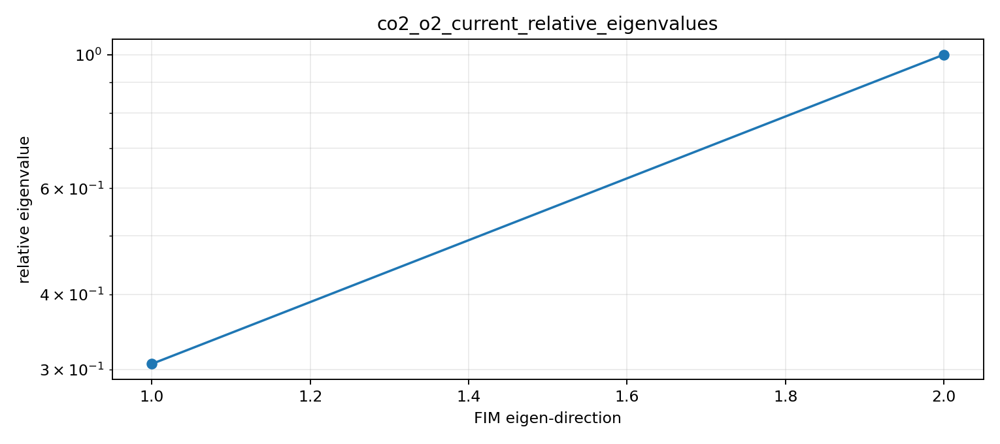

In [18]:
display(Image(filename=str(PLOTS / 'fim' / 'co2_o2_current_relative_eigenvalues.png')))

**Plain-language interpretation.** This focused FIM answers a narrower question than the previous global FIM: can the online CO2 data distinguish the selected gas-release parameters after adding macro-O2 gating? If this block is well-conditioned but aroma fits remain weak, the remaining limitation is not the CO2/O2 gas timing alone.

## 6. CO2/O2 model-based DOE

Candidate natural-must experiments add an experiment FIM to the current-data FIM:

$$F_{total}=F_{current}+\sum_i F_i.$$

The ranking reports D-optimality through \(\log\det(F)\), E-optimality through the minimum eigenvalue, and a hybrid score:

$$\Phi_{hybrid}=\log\det(F)+2\log(\lambda_{min}/\lambda_{max})-0.05\log(\mathrm{trace}(F^{-1})).$$

This focused DOE uses the same additive multi-experiment logic used in the Dowling/Pyomo DoE examples: the current online CO2 data act as prior information and each candidate design contributes incremental information about the selected CO2/O2 gas-transfer parameters. It is not a replacement for a full aroma-coupled MBDoE.


In [19]:
pd.read_csv(RESULTS / 'co2_o2_candidate_ranking.csv').head(15)

,candidate,family,medium,horizon_h,temperature_segments,N_pulses_kg_m3,candidate_logdet,candidate_min_eigenvalue,candidate_max_eigenvalue,candidate_min_relative_eigenvalue,...,var_ratio_CO2sat_scale,var_reduction_CO2sat_scale,target_mean_var_reduction,target_worst_var_reduction,aroma_co2_mean_var_reduction,aroma_co2_worst_var_reduction,hybrid_score,dopt_score,eopt_score,rationale
0,natural_pilot_noN_dynamic_temperature,temperature,natural,300.0,"15, 22, 18, 22",NaN,6.034590,11.543061,36.179961,0.319046,...,0.119186,0.880814,0.708970,0.537125,0.708970,0.537125,6.050002,6.959128,3.217876,Temperature-only perturbation for settings whe...
1,natural_pilot_CO2_warm_start_cool_retention,CO2_strip_retention,natural,300.0,"23, 22, 16, 15",NaN,4.832025,8.654047,14.497810,0.596921,...,0.251730,0.748270,0.605659,0.463048,0.605659,0.463048,5.519776,6.086246,2.872312,"Warm early fermentation maximizes gas release,..."
2,natural_pilot_EA_warm_early_noN,EA_temperature_Nstress,natural,300.0,"24, 23, 19, 17",NaN,5.013015,6.604341,22.766444,0.290091,...,0.180302,0.819698,0.613166,0.406634,0.613166,0.406634,5.445695,6.325952,2.912427,Warm early natural fermentation without nutrie...
3,natural_pilot_warm_to_cool_noN,temperature,natural,300.0,"22, 22, 17, 16",NaN,5.298692,8.036040,24.897212,0.322769,...,0.173834,0.826166,0.634303,0.442440,0.634303,0.442440,5.425353,6.447938,2.937195,"Warm early phase to excite growth and CO2, the..."
4,natural_pilot_CO2_Npulse_release_probe,CO2_N_temperature,natural,300.0,"18, 18, 23, 20",50h:0.045,5.285267,7.207568,27.388835,0.263157,...,0.156478,0.843522,0.633356,0.423190,0.633356,0.423190,5.417585,6.501557,2.948378,N pulse during active growth perturbs CO2 prod...
5,natural_pilot_cold_to_warm_earlyN,temperature_N,natural,300.0,"14, 16, 22, 20",30h:0.045,5.192089,6.973008,25.791422,0.270362,...,0.165635,0.834365,0.624545,0.414726,0.624545,0.414726,5.373202,6.435855,2.921247,Cold start followed by warm transition and ear...
6,natural_pilot_CO2_cold_start_warm_ramp,CO2_solubility_temperature,natural,300.0,"12, 14, 22, 21",54h:0.035,5.650586,7.540783,37.722620,0.199901,...,0.119187,0.880813,0.657507,0.434201,0.657507,0.434201,5.299341,6.791770,2.989996,"Cold start increases CO2 capacity, then warm r..."
7,natural_pilot_EA_cold_warm_Nsplit,EA_temperature_Nsplit,natural,300.0,"13, 18, 23, 19",32h:0.025; 80h:0.035,5.723837,7.037389,43.492969,0.161805,...,0.102474,0.897526,0.662789,0.428051,0.662789,0.428051,5.228898,6.909803,3.001397,Cold start then warm acceleration with split n...
8,natural_pilot_lateN_stationary_probe,N_timing,natural,300.0,"18, 20, 20, 18",80h:0.05,4.992495,5.386366,27.347474,0.196960,...,0.157647,0.842353,0.603564,0.364775,0.603564,0.364775,5.139328,6.403582,2.855106,Late nitrogen addition to test stationary/grow...
9,natural_pilot_reference_18C,reference,natural,300.0,"18, 18, 18, 18",NaN,4.860540,4.731402,27.284488,0.173410,...,0.158226,0.841774,0.591356,0.340938,0.591356,0.340938,5.035250,6.364922,2.819731,Natural must reference at moderate temperature.


In [20]:
pd.read_csv(RESULTS / 'co2_o2_selected_campaign_hybrid.csv')

,objective,campaign_order,candidate,family,medium,horizon_h,temperature_segments,N_pulses_kg_m3,score,rationale,...,campaign_trace_inv,campaign_rank_1e-8,var_ratio_kCO2_release_h,var_reduction_kCO2_release_h,var_ratio_CO2sat_scale,var_reduction_CO2sat_scale,target_mean_var_reduction,target_worst_var_reduction,aroma_co2_mean_var_reduction,aroma_co2_worst_var_reduction
0,hybrid,1,natural_pilot_noN_dynamic_temperature,temperature,natural,300.0,"15, 22, 18, 22",NaN,6.050002,Temperature-only perturbation for settings whe...,...,0.063764,2,0.462875,0.537125,0.119186,0.880814,0.708970,0.537125,0.708970,0.537125
1,hybrid,2,natural_pilot_CO2_warm_start_cool_retention,CO2_strip_retention,natural,300.0,"23, 22, 16, 15",NaN,6.666558,"Warm early fermentation maximizes gas release,...",...,0.047363,2,0.344054,0.655946,0.088429,0.911571,0.783759,0.655946,0.783759,0.655946
2,hybrid,3,natural_pilot_warm_to_cool_noN,temperature,natural,300.0,"22, 22, 17, 16",NaN,6.961405,"Warm early phase to excite growth and CO2, the...",...,0.036225,2,0.276431,0.723569,0.061944,0.938056,0.830812,0.723569,0.830812,0.723569
3,hybrid,4,natural_pilot_EA_warm_early_noN,EA_temperature_Nstress,natural,300.0,"24, 23, 19, 17",NaN,7.167590,Warm early natural fermentation without nutrie...,...,0.030258,2,0.238806,0.761194,0.048355,0.951645,0.856420,0.761194,0.856420,0.761194
4,hybrid,5,natural_pilot_CO2_Npulse_release_probe,CO2_N_temperature,natural,300.0,"18, 18, 23, 20",50h:0.045,7.359230,N pulse during active growth perturbs CO2 prod...,...,0.025581,2,0.207853,0.792147,0.038330,0.961670,0.876909,0.792147,0.876909,0.792147
5,hybrid,6,natural_pilot_cold_to_warm_earlyN,temperature_N,natural,300.0,"14, 16, 22, 20",30h:0.045,7.541384,Cold start followed by warm transition and ear...,...,0.022332,2,0.184628,0.815372,0.032102,0.967898,0.891635,0.815372,0.891635,0.815372


In [21]:
pd.read_csv(RESULTS / 'co2_o2_eigen_spectrum_current_plus_campaign.csv').head(20)

,analysis,direction,eigenvalue,relative_eigenvalue
0,co2_o2_current_plus_campaign,1,62.589442,0.397764
1,co2_o2_current_plus_campaign,2,157.353047,1.000000


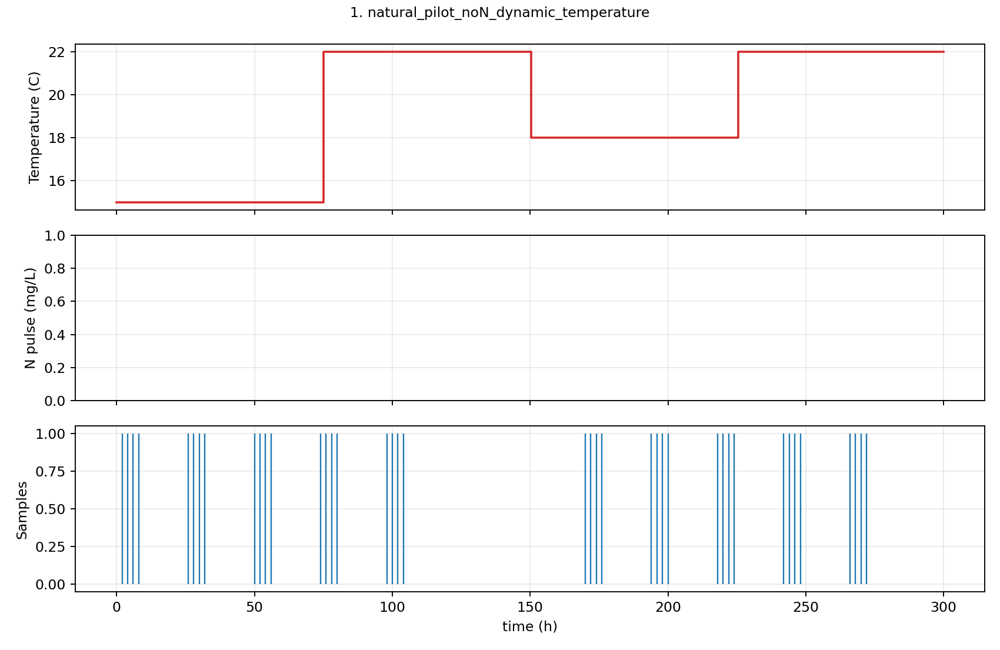

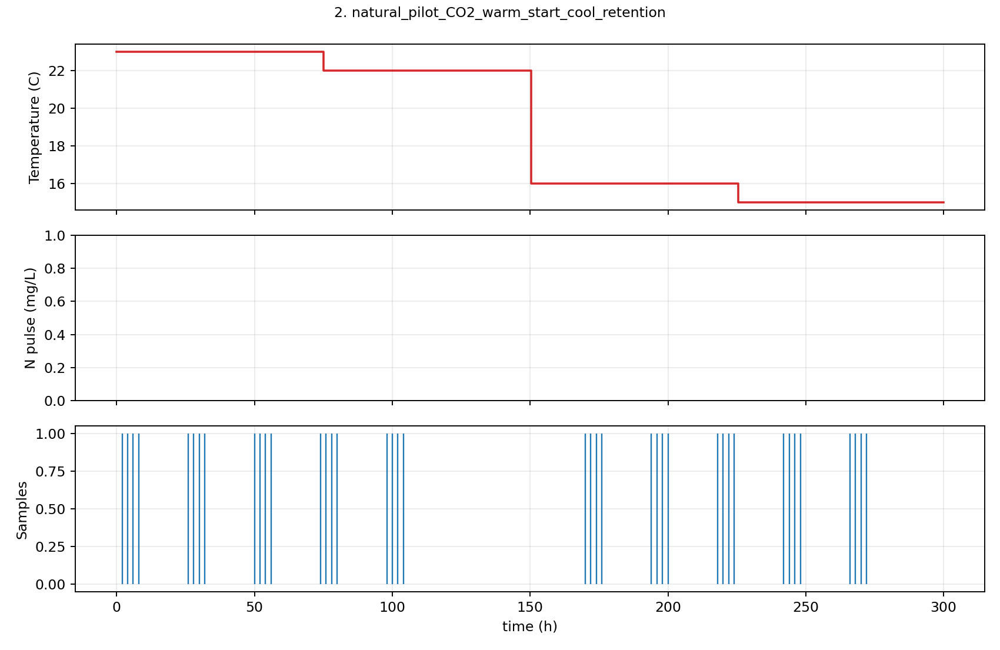

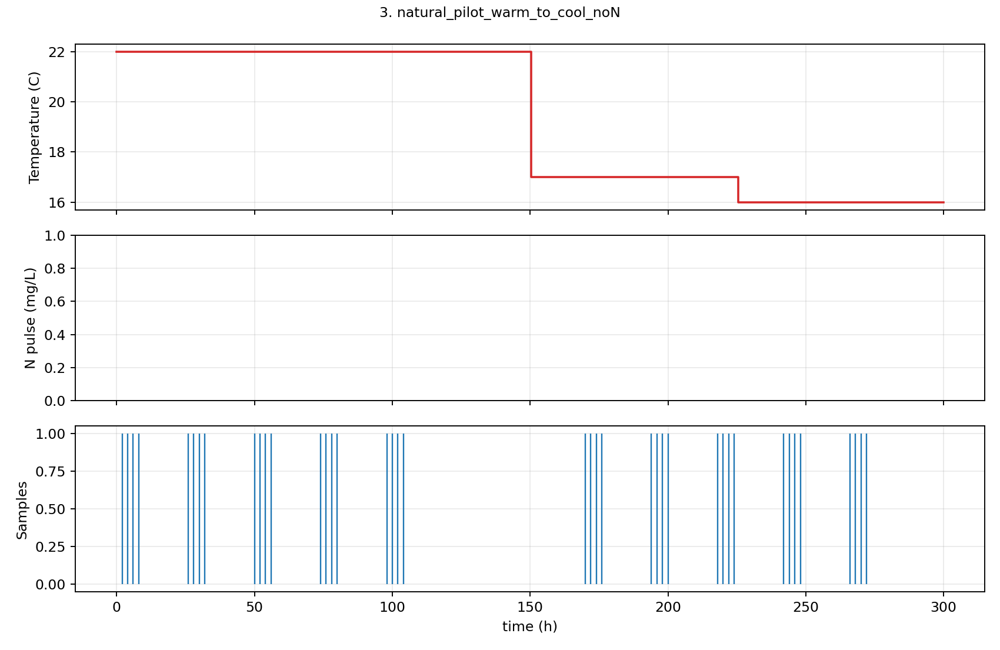

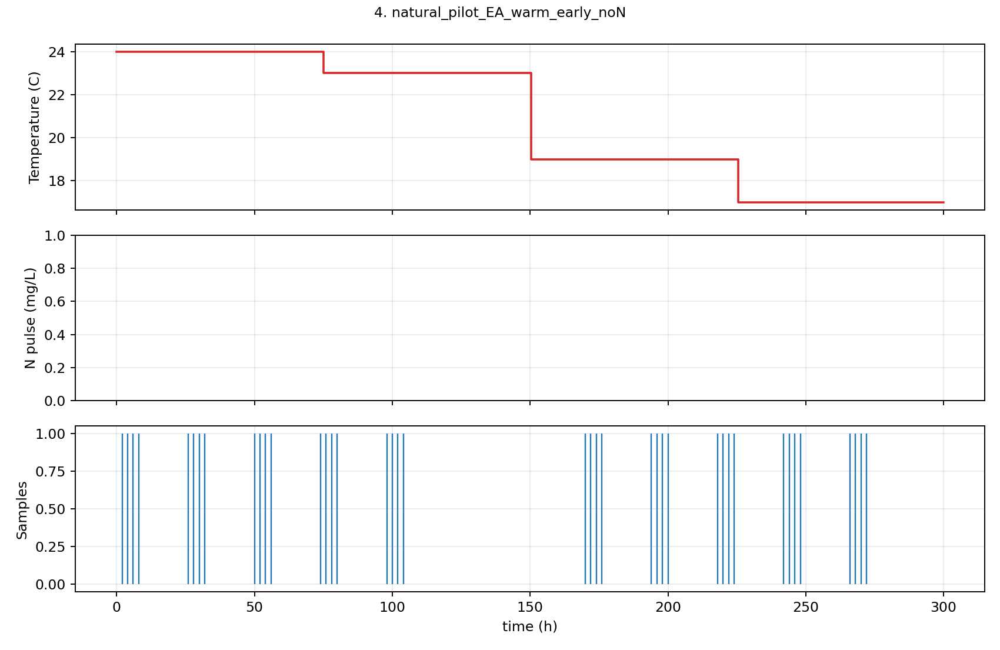

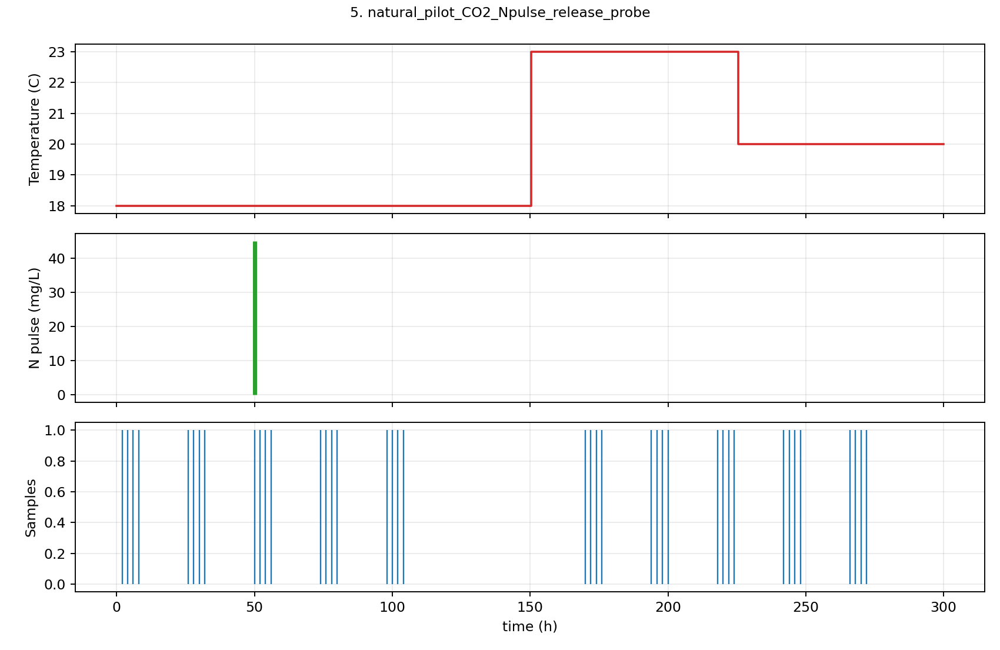

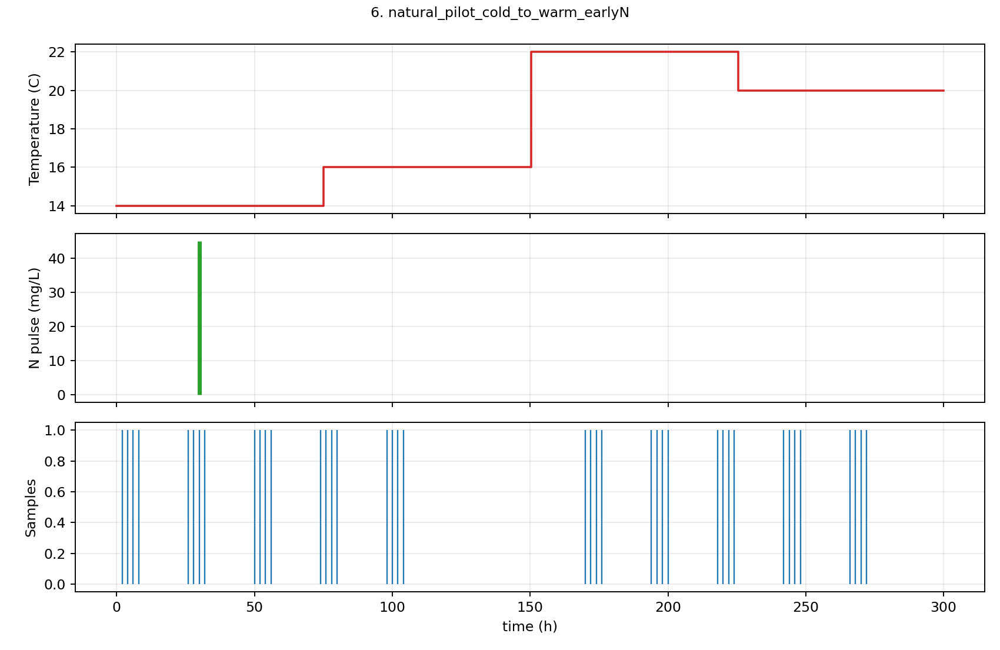

In [22]:
for path in sorted((PLOTS / 'co2_o2_designs').glob('design_*.png')):
    display(Image(filename=str(path)))


**Plain-language interpretation.** The selected campaign begins with: not computed. Designs are chosen because they improve the weakest information directions after accounting for the current pilot data, not because their curves look intuitively different.